# **Final Projects 1 - Linear Regression**

Name: Sarah Aristawidya

Class: PYTN-KS19

# **Introduction**
<hr>

## Latar Belakang

Dengan dataset "Uber vs Lyft Dataset New York, USA," project ini bertujuan untuk menganalisis, memahami, dan memprediksi faktor-faktor yang memengaruhi persaingan antara penyedia layanan transportasi berbasis aplikasi, seperti Uber dan Lyft, di kawasan New York, Amerika Serikat. Perusahaan ini menawarkan layanan transportasi yang serupa, namun bersaing dalam hal harga, kualitas layanan, dan ketersediaan. Oleh karena itu, analisis data ini bertujuan untuk menggali faktor-faktor yang berkontribusi terhadap penetapan harga dan preferensi konsumen.

Project ini berkaitan dengan regresi linear dalam konteks analisis data. Regresi linear digunakan untuk memodelkan hubungan antara variabel dependen, seperti harga layanan transportasi, dan variabel independen, seperti jarak tempuh, cuaca, waktu, atau faktor-faktor lainnya yang dapat memengaruhi harga dan preferensi konsumen. Dalam hal ini, kami bertujuan untuk menemukan hubungan matematis yang terbaik antara variabel-variabel tersebut dan memprediksi harga atau preferensi konsumen berdasarkan data yang telah dikumpulkan.

Penerapan regresi linear dalam analisis ini untuk mengidentifikasi faktor-faktor yang paling signifikan dalam menentukan harga layanan transportasi antara Uber dan Lyft di New York. Dengan pemahaman yang lebih dalam tentang faktor-faktor yang memengaruhi persaingan antara penyedia layanan transportasi ini, perusahaan seperti Uber dan Lyft dapat membuat keputusan yang lebih baik dalam mengelola operasional mereka dan memberikan layanan yang lebih baik kepada pelanggan.

## Overview

**Outline Notebook**
1. Perkenalan
2. Import Libraries
3. Data Loading
4. Data Cleaning
5. Explorasi Data
6. Data Preprocessing
7. Pendefinisian Model
8. Pelatihan Model
9. Evaluasi Model
10. Model Inference
11. Pengambilan Kesimpulan


**Project Overview**

Dataset yang dipakai bernama <b>Uber and Lyft Dataset Boston, MA</b>. Dataset ini berisi kumpulan data informasi tentang perjalanan rideshare yang dilakukan di Boston, Massachusetts, Amerika Serikat. Dataset ini terdiri dari 693071 baris dan 57 kolom, tetapi yang paling relevan ada 10 atribut dari semuanya.

**Attribute Information:**
1. id 
2. timestamp 
3. hour 
4. day 
5. month
6. datetime 
7. timezone 
8. source: destinasi awal 
9. destination: destinasi akhir 
10. cab_type: tipe transportasi (uber / lyft) 
11. … dan lainnya

**Objektif**
Final Project 1 ini dibuat guna mengevaluasi konsep Regression sebagai berikut: 
* Mampu memahami konsep regression dengan Linear Regression.
* Mampu mempersiapkan data untuk digunakan dalam model Linear Regression. 
* Mampu mengimplementasikan Linear Regression untuk membuat prediksi.


**Dataset Link** : https://www.kaggle.com/datasets/brllrb/uber-and-lyft-dataset-boston-ma/data

# **Import Libraries**
<hr>

In [1]:
# Data cleaning and manipulation 
import pandas as pd
import numpy as np
from scipy import stats
import scipy.stats as stats


# Data Visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Modelling
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score, mean_squared_error
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

# Ignore Warning
import warnings
warnings.filterwarnings('ignore')

# **Data Loading**
Data loading is the process of acquiring, importing, or retrieving data from various sources 
<hr>
Load Data: Reading a CSV file into a DataFrame using the pandas library.

In [2]:
data = pd.read_csv('rideshare_kaggle.csv')

# Show 5 data head and tail
data 

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
693066,616d3611-1820-450a-9845-a9ff304a4842,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693067,633a3fc3-1f86-4b9e-9d48-2b7132112341,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693068,64d451d0-639f-47a4-9b7c-6fd92fbd264f,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693069,727e5f07-a96b-4ad1-a2c7-9abc3ad55b4e,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800


Creating a copy of the original data by defining it as 'df' to ensure the original data.

In [3]:
df = data.copy()
df

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
693066,616d3611-1820-450a-9845-a9ff304a4842,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693067,633a3fc3-1f86-4b9e-9d48-2b7132112341,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693068,64d451d0-639f-47a4-9b7c-6fd92fbd264f,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693069,727e5f07-a96b-4ad1-a2c7-9abc3ad55b4e,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800


In [4]:
# Show how many rows and columns in dataset
df.shape

(693071, 57)

In [5]:
# View dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693071 entries, 0 to 693070
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           693071 non-null  object 
 1   timestamp                    693071 non-null  float64
 2   hour                         693071 non-null  int64  
 3   day                          693071 non-null  int64  
 4   month                        693071 non-null  int64  
 5   datetime                     693071 non-null  object 
 6   timezone                     693071 non-null  object 
 7   source                       693071 non-null  object 
 8   destination                  693071 non-null  object 
 9   cab_type                     693071 non-null  object 
 10  product_id                   693071 non-null  object 
 11  name                         693071 non-null  object 
 12  price                        637976 non-null  float64
 13 

In [6]:
# Check the number of missing values in the dataset
df.isnull().sum()

id                                 0
timestamp                          0
hour                               0
day                                0
month                              0
datetime                           0
timezone                           0
source                             0
destination                        0
cab_type                           0
product_id                         0
name                               0
price                          55095
distance                           0
surge_multiplier                   0
latitude                           0
longitude                          0
temperature                        0
apparentTemperature                0
short_summary                      0
long_summary                       0
precipIntensity                    0
precipProbability                  0
humidity                           0
windSpeed                          0
windGust                           0
windGustTime                       0
v

# **Data Cleaning**
Data cleaning is the process of identifying and correcting or removing errors, inconsistencies, inaccuracies, and incomplete parts from a dataset. 
<hr>

In [7]:
# Show 5 column from the top 
df.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [8]:
# Display whether there are missing values in each attribute with a boolean representation (true/false)
df.isna().any()

id                             False
timestamp                      False
hour                           False
day                            False
month                          False
datetime                       False
timezone                       False
source                         False
destination                    False
cab_type                       False
product_id                     False
name                           False
price                           True
distance                       False
surge_multiplier               False
latitude                       False
longitude                      False
temperature                    False
apparentTemperature            False
short_summary                  False
long_summary                   False
precipIntensity                False
precipProbability              False
humidity                       False
windSpeed                      False
windGust                       False
windGustTime                   False
v

In [9]:
# Check the number of missing values in the dataset
df.isnull().sum()

id                                 0
timestamp                          0
hour                               0
day                                0
month                              0
datetime                           0
timezone                           0
source                             0
destination                        0
cab_type                           0
product_id                         0
name                               0
price                          55095
distance                           0
surge_multiplier                   0
latitude                           0
longitude                          0
temperature                        0
apparentTemperature                0
short_summary                      0
long_summary                       0
precipIntensity                    0
precipProbability                  0
humidity                           0
windSpeed                          0
windGust                           0
windGustTime                       0
v

In [10]:
# Display the percentage of missing values
df.isna().sum() /len(df) *100

id                             0.000000
timestamp                      0.000000
hour                           0.000000
day                            0.000000
month                          0.000000
datetime                       0.000000
timezone                       0.000000
source                         0.000000
destination                    0.000000
cab_type                       0.000000
product_id                     0.000000
name                           0.000000
price                          7.949402
distance                       0.000000
surge_multiplier               0.000000
latitude                       0.000000
longitude                      0.000000
temperature                    0.000000
apparentTemperature            0.000000
short_summary                  0.000000
long_summary                   0.000000
precipIntensity                0.000000
precipProbability              0.000000
humidity                       0.000000
windSpeed                      0.000000


Dapat dilihat pada data di atas, diketahui bahwa `terdapat banyak nilai null pada kolom price` sebesar 55095 dan fitur price merupakan variable yang bergantung pada projek yang akan dibuat, jika memaksa mengisi nilai null pada fitur price akan mengakibatkan lebih banyak nilai yang error dan akurasi yang kurang. Jadi akan `dihapus semua record dimana kolom price memiliki nilai null`.

In [11]:
# Remove missing values in the "price" column
df = df.dropna(subset=['price']).reset_index()

In [12]:
# Check the number of missing values in the dataset
df.isnull().sum()

index                          0
id                             0
timestamp                      0
hour                           0
day                            0
month                          0
datetime                       0
timezone                       0
source                         0
destination                    0
cab_type                       0
product_id                     0
name                           0
price                          0
distance                       0
surge_multiplier               0
latitude                       0
longitude                      0
temperature                    0
apparentTemperature            0
short_summary                  0
long_summary                   0
precipIntensity                0
precipProbability              0
humidity                       0
windSpeed                      0
windGust                       0
windGustTime                   0
visibility                     0
temperatureHigh                0
temperatur

In [13]:
# Check duplicated data
df.duplicated().sum()

0

## Check for Correlations

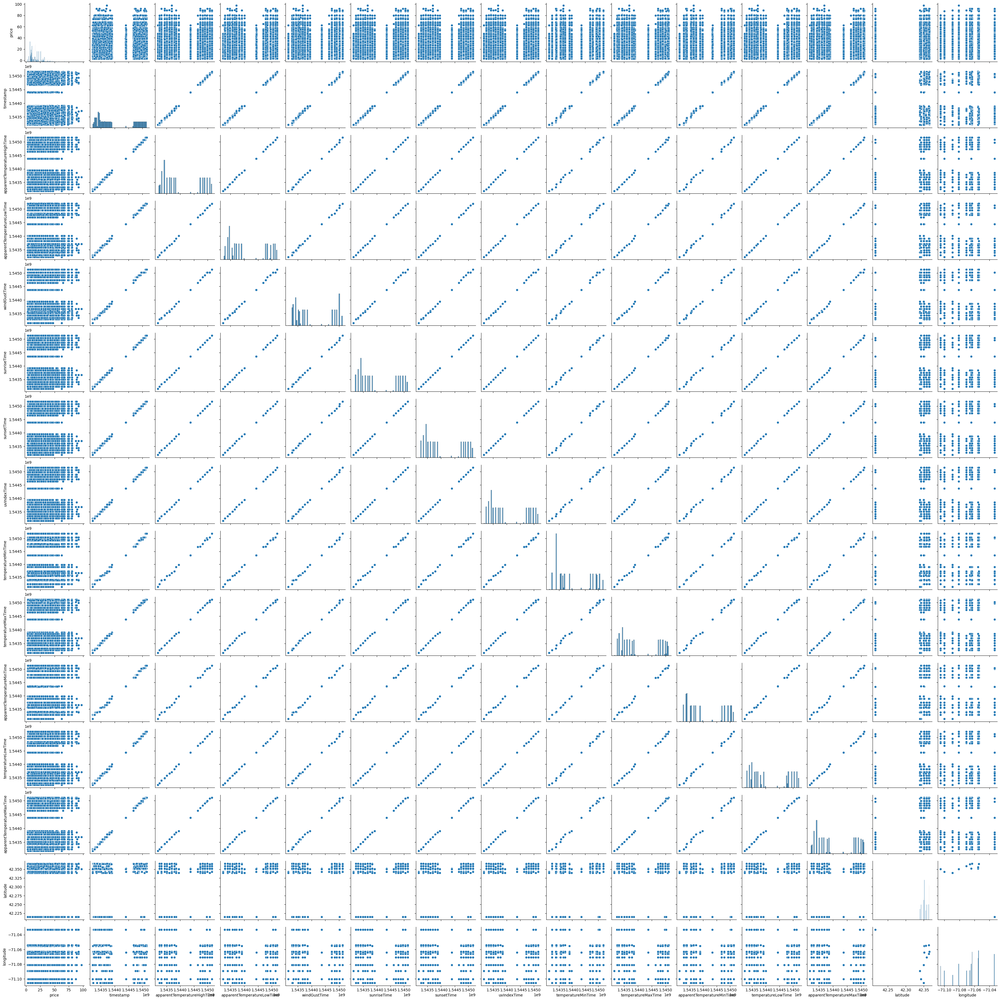

In [14]:
# Check which features have a relationship with the prediction ('price')
check_cols = df[['price', 'id', 'timestamp', 'datetime', 'long_summary', 'apparentTemperatureHighTime', 'apparentTemperatureLowTime',
                 'windGustTime', 'sunriseTime', 'sunsetTime', 'uvIndexTime', 'temperatureMinTime', 'temperatureMaxTime',
                 'apparentTemperatureMinTime', 'temperatureLowTime', 'apparentTemperatureMaxTime', 'latitude', 'longitude']]

# Display visualization using a pairplot
sns.pairplot(check_cols)
plt.show()

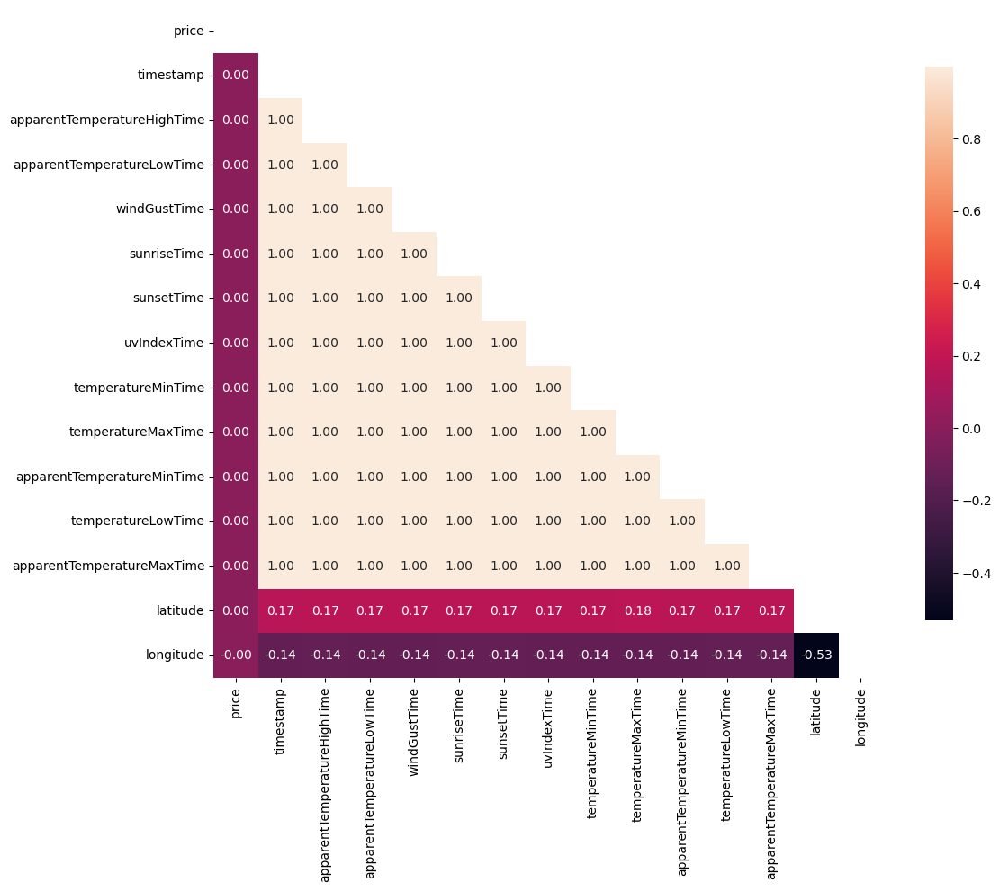

In [15]:
check_cols = df[['price', 'id', 'timestamp', 'datetime', 'long_summary', 'apparentTemperatureHighTime', 'apparentTemperatureLowTime',
                 'windGustTime', 'sunriseTime', 'sunsetTime', 'uvIndexTime', 'temperatureMinTime', 'temperatureMaxTime',
                 'apparentTemperatureMinTime', 'temperatureLowTime', 'apparentTemperatureMaxTime', 'latitude', 'longitude']]

# Create correlation matrix
corr_matrix = check_cols.corr()

# Create a mask
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set the figure size
plt.figure(figsize=(12, 10))

# Create a heatmap
sns.heatmap(corr_matrix,
            annot=True,
            fmt=".2f",  # Format for the annotations
            mask=mask,  # To hide the upper triangle
            cbar_kws={"shrink": 0.8},  # To adjust the colorbar size
            square=True)  # To make the cells square

plt.show()

**Kesimpulan**

Baerdarakan pairplot dan heatmap di atas, dapat ilihat bahwa `korelasi Pearson (r) mendekati 0, maka dapat diketahui korelasi yang terbentuk lemah atau tidak ada korelasi`. Sehingga dapat dismpulkan bahwa perubahan dalam satu variabel tidak terkait erat dengan perubahan dalam variabel lainnya maka kita akan menghapus semua kolom tersebut.

In [16]:
# Remove features that are not related to the prediction of 'price'
# Distance and time-related attributes are already available
df = df.drop(['id', 'timestamp', 'datetime', 'long_summary', 'apparentTemperatureHighTime', 'apparentTemperatureLowTime',
              'windGustTime', 'sunriseTime', 'sunsetTime', 'uvIndexTime', 'temperatureMinTime', 'temperatureMaxTime',
              'apparentTemperatureMinTime', 'temperatureLowTime', 'apparentTemperatureMaxTime', 'latitude', 'longitude'],
              axis=1)
print(df.shape)
df.head()

(637976, 41)


,index,hour,day,month,timezone,source,destination,cab_type,product_id,name,...,cloudCover,uvIndex,visibility.1,ozone,moonPhase,precipIntensityMax,temperatureMin,temperatureMax,apparentTemperatureMin,apparentTemperatureMax
0,0,9,16,12,America/New_York,Haymarket Square,North Station,Lyft,lyft_line,Shared,...,0.72,0,10.000,303.8,0.30,0.1276,39.89,43.68,33.73,38.07
1,1,2,27,11,America/New_York,Haymarket Square,North Station,Lyft,lyft_premier,Lux,...,1.00,0,4.786,291.1,0.64,0.1300,40.49,47.30,36.20,43.92
2,2,1,28,11,America/New_York,Haymarket Square,North Station,Lyft,lyft,Lyft,...,0.03,0,10.000,315.7,0.68,0.1064,35.36,47.55,31.04,44.12
3,3,4,30,11,America/New_York,Haymarket Square,North Station,Lyft,lyft_luxsuv,Lux Black XL,...,0.00,0,10.000,291.1,0.75,0.0000,34.67,45.03,30.30,38.53
4,4,3,29,11,America/New_York,Haymarket Square,North Station,Lyft,lyft_plus,Lyft XL,...,0.44,0,10.000,347.7,0.72,0.0001,33.10,42.18,29.11,35.75


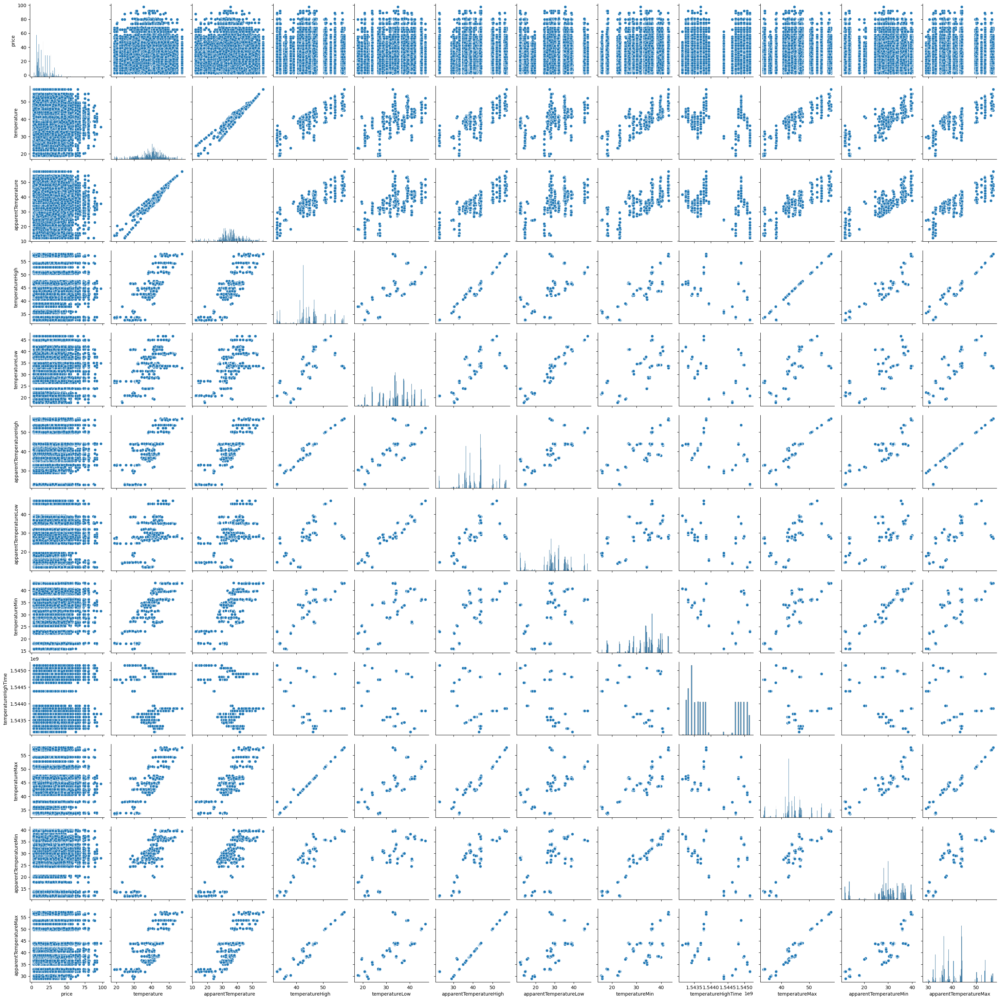

In [17]:
# Checking the correlation between the 'price' feature and features related to temperature
temp_cols = df[['price','temperature','apparentTemperature','temperatureHigh','temperatureLow','apparentTemperatureHigh',
'apparentTemperatureLow','temperatureMin','temperatureHighTime','temperatureMax','apparentTemperatureMin',
'apparentTemperatureMax']]

# Display visualization of price with temperature-related features
sns.pairplot(temp_cols)
plt.show()

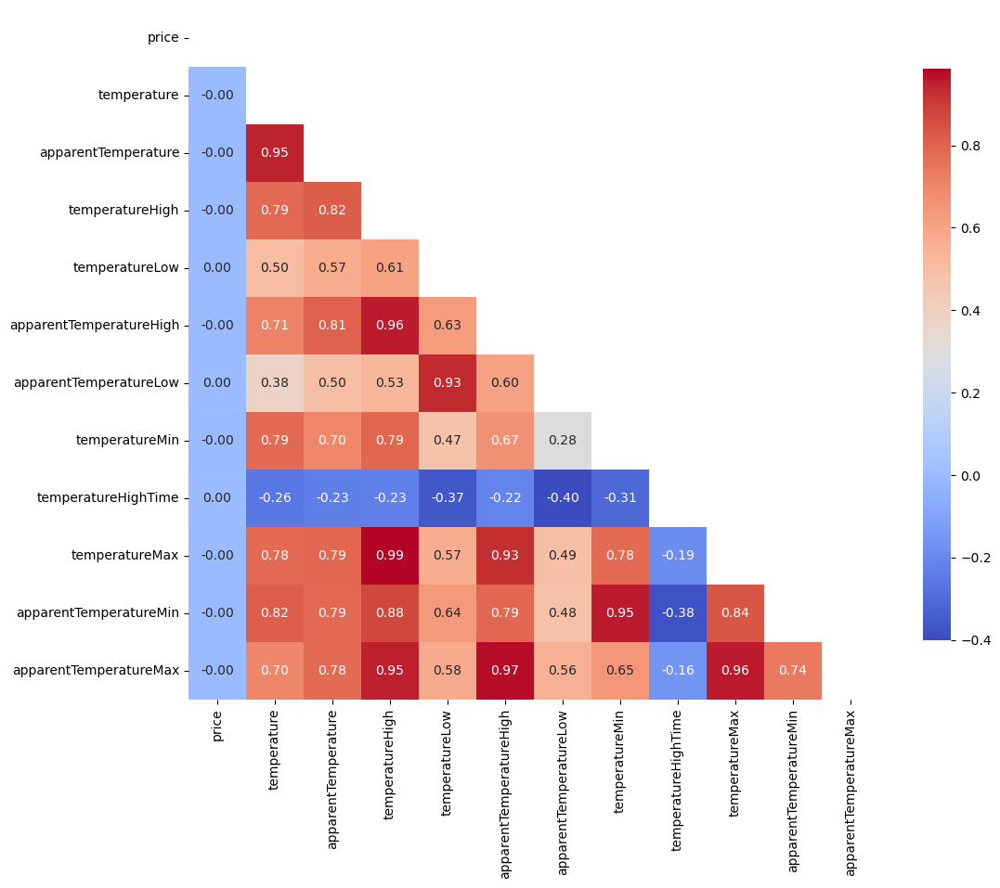

In [18]:
temp_cols = df[['price','temperature','apparentTemperature','temperatureHigh','temperatureLow','apparentTemperatureHigh',
'apparentTemperatureLow','temperatureMin','temperatureHighTime','temperatureMax','apparentTemperatureMin',
'apparentTemperatureMax']]

# Create correlation matrix
corr_matrix = temp_cols.corr()

# Create a mask
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set the figure size
plt.figure(figsize=(12, 10))

# Create a heatmap
sns.heatmap(corr_matrix,
            annot=True,
            fmt=".2f",  # Format for the annotations
            cmap="coolwarm",  # Colormap
            mask=mask,  # To hide the upper triangle
            cbar_kws={"shrink": 0.8},  # To adjust the colorbar size
            square=True)  # To make the cells square

plt.show()

**Kesimpulan**

Baerdarakan pairplot dan heatmap di atas, dapat ilihat bahwa `korelasi Pearson (r) mendekati 0, maka dapat diketahui korelasi yang terbentuk lemah atau tidak ada korelasi`. Sehingga dapat dismpulkan bahwa perubahan dalam satu variabel tidak terkait erat dengan perubahan dalam variabel lainnya maka kita akan menghapus semua kolom yang berkaitan dengan temperatur.

In [19]:
# Remove all features related to temperature from the dataframe because they have a weak correlation with the target feature (price)
new_df = df[['temperature', 'apparentTemperature', 'temperatureHigh', 'temperatureLow', 'apparentTemperatureHigh',
            'apparentTemperatureLow', 'temperatureMin', 'temperatureHighTime', 'temperatureMax', 'apparentTemperatureMin',
            'apparentTemperatureMax']]
df = df.drop(new_df.columns, axis=1)

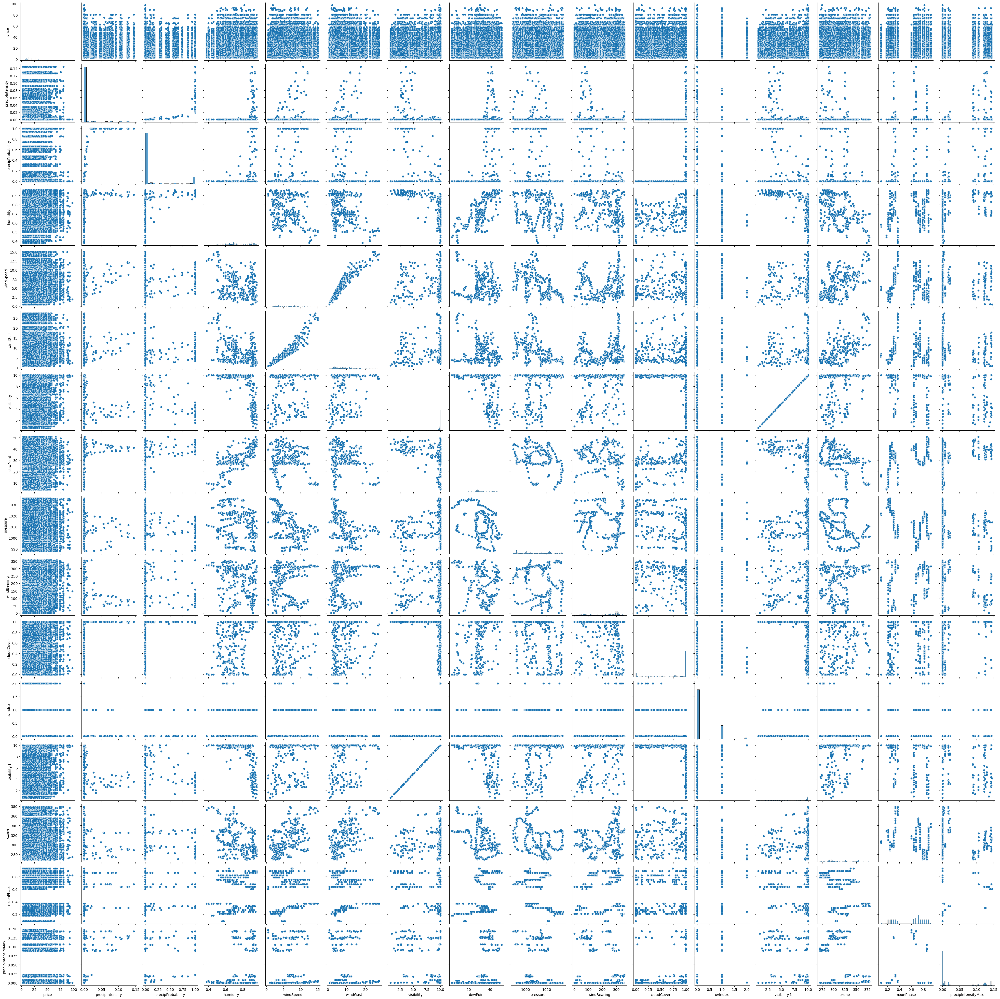

In [20]:
# Checking the correlation between the 'price' feature and features related to climate
climate_cols = df[['price','precipIntensity','precipProbability','humidity','windSpeed','windGust',
'visibility','dewPoint','pressure','windBearing','cloudCover','uvIndex','visibility.1',
'ozone','moonPhase','precipIntensityMax']]

#Display a visualization of price with climate-related features
sns.pairplot(climate_cols)
plt.show()

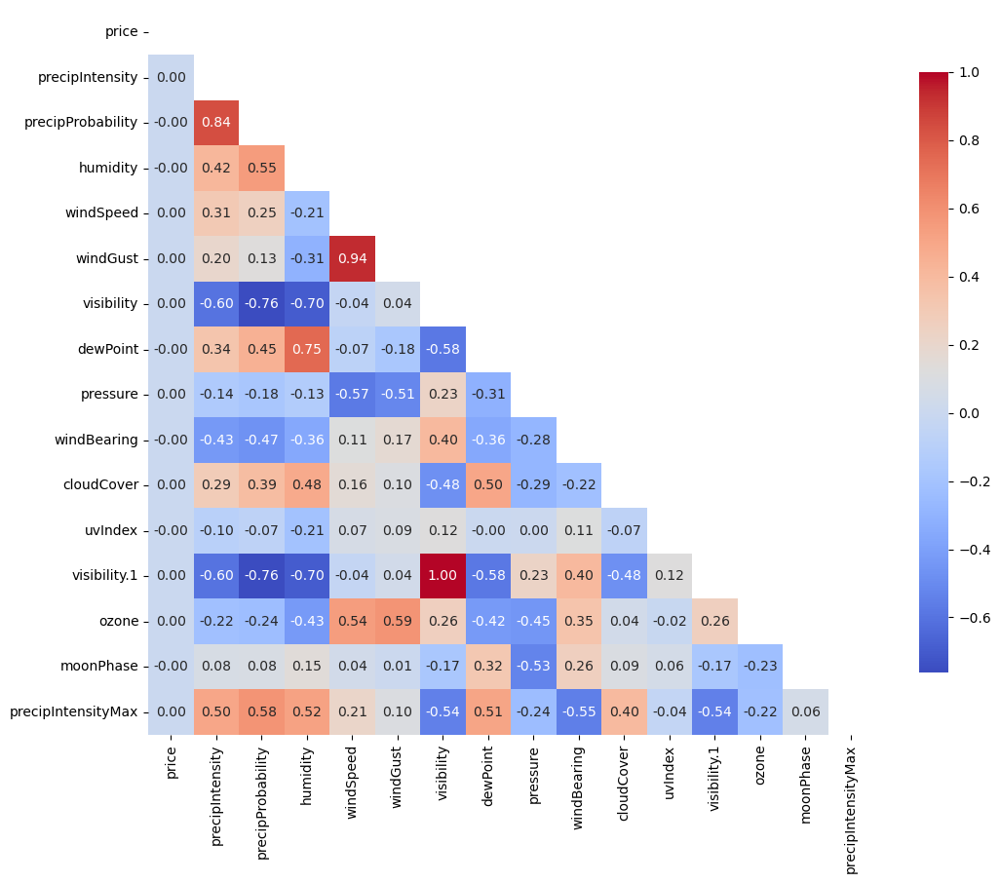

In [21]:
climate_cols = df[['price','precipIntensity','precipProbability','humidity','windSpeed','windGust',
'visibility','dewPoint','pressure','windBearing','cloudCover','uvIndex','visibility.1',
'ozone','moonPhase','precipIntensityMax']]


# Create correlation matrix
corr_matrix = climate_cols.corr()

# Create a mask
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set the figure size
plt.figure(figsize=(12, 10))

# Create a heatmap
sns.heatmap(corr_matrix,
            annot=True,
            fmt=".2f",  # Format for the annotations
            cmap="coolwarm",  # Colormap
            mask=mask,  # To hide the upper triangle
            cbar_kws={"shrink": 0.8},  # To adjust the colorbar size
            square=True)  # To make the cells square

plt.show()

**Kesimpulan**

Baerdarakan pairplot dan heatmap di atas, dapat ilihat bahwa `korelasi Pearson (r) mendekati 0, maka dapat diketahui korelasi yang terbentuk lemah atau tidak ada korelasi`. Sehingga dapat dismpulkan bahwa perubahan dalam satu variabel tidak terkait erat dengan perubahan dalam variabel lainnya maka kita akan menghapus semua kolom yang berkaitan dengan climate.

In [22]:
# Remove all features related to climate from the dataframe because they have a weak correlation with the target feature (price)
climate_cols = ['precipIntensity', 'precipProbability', 'humidity', 'windSpeed', 'windGust',
                'visibility', 'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex', 'visibility.1',
                'ozone', 'moonPhase', 'precipIntensityMax']
df = df.drop(climate_cols, axis=1)
print(df.shape)
df.head()

(637976, 15)


,index,hour,day,month,timezone,source,destination,cab_type,product_id,name,price,distance,surge_multiplier,short_summary,icon
0,0,9,16,12,America/New_York,Haymarket Square,North Station,Lyft,lyft_line,Shared,5.0,0.44,1.0,Mostly Cloudy,partly-cloudy-night
1,1,2,27,11,America/New_York,Haymarket Square,North Station,Lyft,lyft_premier,Lux,11.0,0.44,1.0,Rain,rain
2,2,1,28,11,America/New_York,Haymarket Square,North Station,Lyft,lyft,Lyft,7.0,0.44,1.0,Clear,clear-night
3,3,4,30,11,America/New_York,Haymarket Square,North Station,Lyft,lyft_luxsuv,Lux Black XL,26.0,0.44,1.0,Clear,clear-night
4,4,3,29,11,America/New_York,Haymarket Square,North Station,Lyft,lyft_plus,Lyft XL,9.0,0.44,1.0,Partly Cloudy,partly-cloudy-night


In [23]:
# View dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 637976 entries, 0 to 637975
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   index             637976 non-null  int64  
 1   hour              637976 non-null  int64  
 2   day               637976 non-null  int64  
 3   month             637976 non-null  int64  
 4   timezone          637976 non-null  object 
 5   source            637976 non-null  object 
 6   destination       637976 non-null  object 
 7   cab_type          637976 non-null  object 
 8   product_id        637976 non-null  object 
 9   name              637976 non-null  object 
 10  price             637976 non-null  float64
 11  distance          637976 non-null  float64
 12  surge_multiplier  637976 non-null  float64
 13  short_summary     637976 non-null  object 
 14  icon              637976 non-null  object 
dtypes: float64(3), int64(4), object(8)
memory usage: 73.0+ MB


In [24]:
# Display features with categorical data type
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
new_data = df[categorical_cols]
new_data.head()

,timezone,source,destination,cab_type,product_id,name,short_summary,icon
0,America/New_York,Haymarket Square,North Station,Lyft,lyft_line,Shared,Mostly Cloudy,partly-cloudy-night
1,America/New_York,Haymarket Square,North Station,Lyft,lyft_premier,Lux,Rain,rain
2,America/New_York,Haymarket Square,North Station,Lyft,lyft,Lyft,Clear,clear-night
3,America/New_York,Haymarket Square,North Station,Lyft,lyft_luxsuv,Lux Black XL,Clear,clear-night
4,America/New_York,Haymarket Square,North Station,Lyft,lyft_plus,Lyft XL,Partly Cloudy,partly-cloudy-night


In [25]:
# Loop through each column
for column in new_data:
    # Display unique values in the column, sorted
    unique_values = df[column].sort_values().unique()
    print(f"Column: {column}")
    print(unique_values)
    print("\n")

Column: timezone
['America/New_York']


Column: source
['Back Bay' 'Beacon Hill' 'Boston University' 'Fenway'
 'Financial District' 'Haymarket Square' 'North End' 'North Station'
 'Northeastern University' 'South Station' 'Theatre District' 'West End']


Column: destination
['Back Bay' 'Beacon Hill' 'Boston University' 'Fenway'
 'Financial District' 'Haymarket Square' 'North End' 'North Station'
 'Northeastern University' 'South Station' 'Theatre District' 'West End']


Column: cab_type
['Lyft' 'Uber']


Column: product_id
['55c66225-fbe7-4fd5-9072-eab1ece5e23e'
 '6c84fd89-3f11-4782-9b50-97c468b19529'
 '6d318bcc-22a3-4af6-bddd-b409bfce1546'
 '6f72dfc5-27f1-42e8-84db-ccc7a75f6969'
 '997acbb5-e102-41e1-b155-9df7de0a73f2'
 '9a0e7b09-b92b-4c41-9779-2ad22b4d779d' 'lyft' 'lyft_line' 'lyft_lux'
 'lyft_luxsuv' 'lyft_plus' 'lyft_premier']


Column: name
['Black' 'Black SUV' 'Lux' 'Lux Black' 'Lux Black XL' 'Lyft' 'Lyft XL'
 'Shared' 'UberPool' 'UberX' 'UberXL' 'WAV']


Column: short_summary
[' 

In [26]:
# Get all column names in the DataFrame
columns = new_data.columns

# Loop to get the contents of each column
for column in columns:
    value_counts = new_data[column].value_counts()
    print(f"Contents of '{column}':\n{value_counts}\n")

Contents of 'timezone':
America/New_York    637976
Name: timezone, dtype: int64

Contents of 'source':
Financial District         54197
Back Bay                   53201
Theatre District           53201
Boston University          53172
North End                  53171
Fenway                     53166
Northeastern University    53164
South Station              53160
Haymarket Square           53147
West End                   52980
Beacon Hill                52841
North Station              52576
Name: source, dtype: int64

Contents of 'destination':
Financial District         54192
Back Bay                   53190
Theatre District           53189
Haymarket Square           53171
Boston University          53171
Fenway                     53166
Northeastern University    53165
North End                  53164
South Station              53159
West End                   52992
Beacon Hill                52840
North Station              52577
Name: destination, dtype: int64

Contents of 'cab_

In [27]:
# Calculate the total number of data in each column
total_counts = len(new_data)
# Get all column names in the DataFrame
columns = new_data.columns

# Loop to calculate the percentage of contents in each column
for column in columns:
    value_counts = new_data[column].value_counts()
    percentages = (value_counts / total_counts) * 100
    print(f"Percentage of '{column}':\n{percentages}\n")

Percentage of 'timezone':
America/New_York    100.0
Name: timezone, dtype: float64

Percentage of 'source':
Financial District         8.495147
Back Bay                   8.339028
Theatre District           8.339028
Boston University          8.334483
North End                  8.334326
Fenway                     8.333542
Northeastern University    8.333229
South Station              8.332602
Haymarket Square           8.330564
West End                   8.304388
Beacon Hill                8.282600
North Station              8.241062
Name: source, dtype: float64

Percentage of 'destination':
Financial District         8.494363
Back Bay                   8.337304
Theatre District           8.337147
Haymarket Square           8.334326
Boston University          8.334326
Fenway                     8.333542
Northeastern University    8.333386
North End                  8.333229
South Station              8.332445
West End                   8.306269
Beacon Hill                8.282443
North

It can be observed from above that the 'timezone' feature has only one value, and the 'product_id' feature contains many unidentified values. Therefore, we can choose to delete or drop them.

In [28]:
# Remove the 'timezone' and 'product_id' columns
df = df.drop(['timezone', 'product_id'], axis=1)
df.head()

,index,hour,day,month,source,destination,cab_type,name,price,distance,surge_multiplier,short_summary,icon
0,0,9,16,12,Haymarket Square,North Station,Lyft,Shared,5.0,0.44,1.0,Mostly Cloudy,partly-cloudy-night
1,1,2,27,11,Haymarket Square,North Station,Lyft,Lux,11.0,0.44,1.0,Rain,rain
2,2,1,28,11,Haymarket Square,North Station,Lyft,Lyft,7.0,0.44,1.0,Clear,clear-night
3,3,4,30,11,Haymarket Square,North Station,Lyft,Lux Black XL,26.0,0.44,1.0,Clear,clear-night
4,4,3,29,11,Haymarket Square,North Station,Lyft,Lyft XL,9.0,0.44,1.0,Partly Cloudy,partly-cloudy-night


In [29]:
# Remove the 'index' column
df = df.drop(['index'], axis=1)

In [30]:
# Display features with numeric data type
num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
new_data = df[num_cols]
new_data.head()

,hour,day,month,price,distance,surge_multiplier
0,9,16,12,5.0,0.44,1.0
1,2,27,11,11.0,0.44,1.0
2,1,28,11,7.0,0.44,1.0
3,4,30,11,26.0,0.44,1.0
4,3,29,11,9.0,0.44,1.0


# **Data Exploration**
Data Exploration is the process of analyzing and visualizing a dataset to gain insights and understand its characteristics.
<hr>

In [31]:
# Get a list of columns in the dataset
dataset_columns = df.columns

# Loop through each column
for column in dataset_columns:
    # Display unique values in the column, sorted
    unique_values = df[column].sort_values().unique()
    print(f"Column: {column}")
    print(unique_values)
    print("\n")

Column: hour
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]


Column: day
[ 1  2  3  4  9 10 13 14 15 16 17 18 26 27 28 29 30]


Column: month
[11 12]


Column: source
['Back Bay' 'Beacon Hill' 'Boston University' 'Fenway'
 'Financial District' 'Haymarket Square' 'North End' 'North Station'
 'Northeastern University' 'South Station' 'Theatre District' 'West End']


Column: destination
['Back Bay' 'Beacon Hill' 'Boston University' 'Fenway'
 'Financial District' 'Haymarket Square' 'North End' 'North Station'
 'Northeastern University' 'South Station' 'Theatre District' 'West End']


Column: cab_type
['Lyft' 'Uber']


Column: name
['Black' 'Black SUV' 'Lux' 'Lux Black' 'Lux Black XL' 'Lyft' 'Lyft XL'
 'Shared' 'UberPool' 'UberX' 'UberXL' 'WAV']


Column: price
[ 2.5   3.    3.5   4.5   5.    5.5   6.    6.5   7.    7.5   7.98  8.
  8.35  8.5   9.    9.35  9.5  10.   10.5  10.6  11.   11.5  11.6  12.
 12.5  13.   13.5  14.   14.5  15.   15.5  16.   16.5  17.   17

## Pie Chart

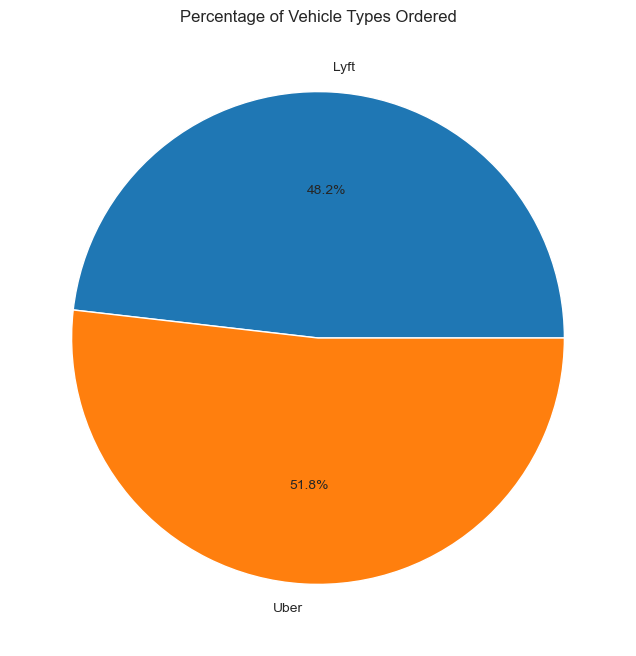

In [32]:
# Calculate the total number of vehicles ordered for each vehicle type
counts = df.groupby('cab_type')['distance'].count()

# Calculate the percentage of each vehicle type
percentages = counts / counts.sum() * 100

# Display a pie chart
sns.set_style("whitegrid")
plt.figure(figsize=(8, 8))
plt.pie(percentages.values, labels=percentages.index, autopct='%1.1f%%')
plt.title('Percentage of Vehicle Types Ordered')
plt.show()

**Kesimpulan:**

Dari grafik pie yang dihasilkan, kita dapat menyimpulkan seberapa besar persentase pemesanan yang datang dari masing-masing perusahaan Uber dan Lyft. Dengan demikian, analisis ini dapat memberikan wawasan bagi bisnis untuk memahami preferensi pelanggan terkait perusahaan taksi online Uber dan Lyft di wilayah tersebut. Berdasarkan grafik pie di atas, dapat disimpulkan bahwa `persentase Uber 51,8% lebih banyak dipesan dibandingkan dengan Lyft`.

## Histogram Plot

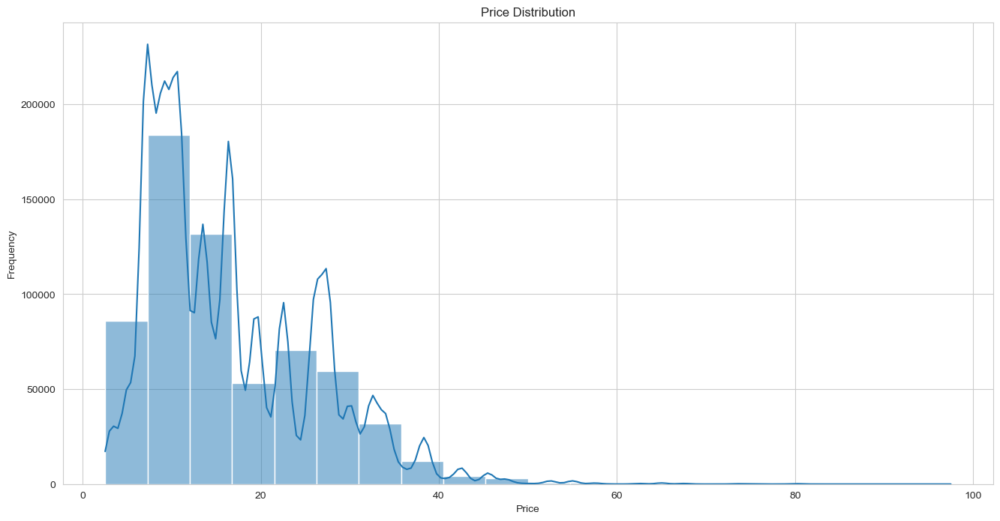

In [33]:
# Set the size of the plot
plt.figure(figsize=(16, 8))

# Create a histogram of the price distribution using seaborn
sns.histplot(data=df, x='price', bins=20, kde=True)

# Add a plot title
plt.title('Price Distribution')

# Add the x-axis label
plt.xlabel('Price')

# Add the y-axis label
plt.ylabel('Frequency')

# Display the histogram plot
plt.show()

**Kesimpulan:**

Dari grafik di atas, kita dapat `melihat distribusi harga (price) dari layanan taksi Uber dan Lyft` dalam dataset. Distribusi harga tersebut ditampilkan dalam bentuk histogram dengan adanya garis KDE (Kernel Density Estimation) sebagai perkiraan kurva distribusi harga secara keseluruhan. Dari grafik ini, kita dapat menyimpulkan sebaran harga layanan taksi Uber dan Lyft di wilayah tersebut.

## Central Tendency
Mencari tahu mengenai central tendency(titik pusat), rata-rata dari pengguna Uber dan Lyft

In [34]:
uber = df[df['cab_type']=='Uber']
lyft = df[df['cab_type']=='Lyft']

### Uber
Mencari harga tarif Uber dengan membandingkan jarak (distance) dengan harga (price) dari layanan Uber, dengan menggunakan kelipatan surge (surge_multiplier)

Text(0.5, 1.0, 'Uber: Distance - Price')

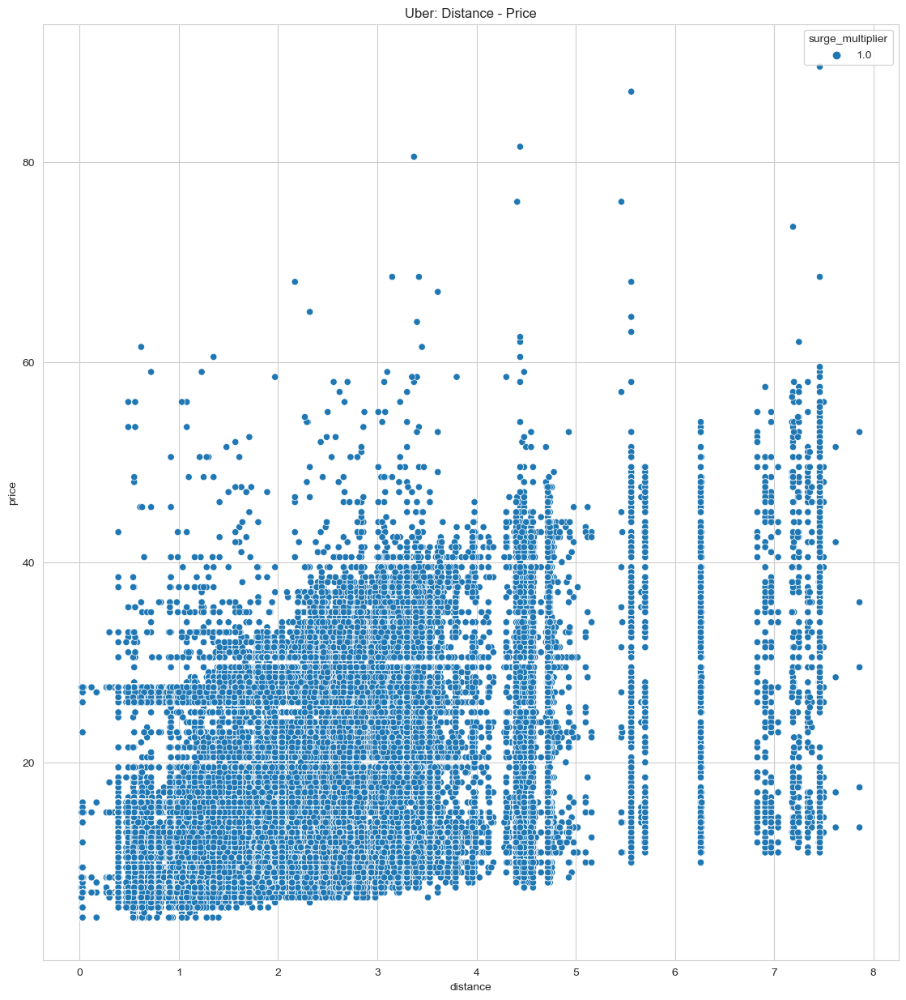

In [35]:
# Filter the DataFrame according to the columns you need
uber_sm_dis_price = uber[['distance', 'surge_multiplier', 'price']]

# Plot using a scatter plot
plt.figure(figsize=(30, 15))
plt.subplot(121)
sns.scatterplot(data=uber_sm_dis_price, x='distance', y='price', hue='surge_multiplier')
plt.title('Uber: Distance - Price')

**Kesimpulan:**

Scatter plot tersebut menggambarkan hubungan antara jarak (distance) dan harga (price) layanan Uber. Dari grafik ini, kita dapat melihat pola hubungan antara jarak perjalanan, harga, dan faktor surge multiplier dalam layanan Uber. Berdasarkan scatter plot di atas dapat diketahui hubungan `distance dan price sangatlah kecil atau tidak ada hubungan` dikarenakan price tidak bertambah secara linier.

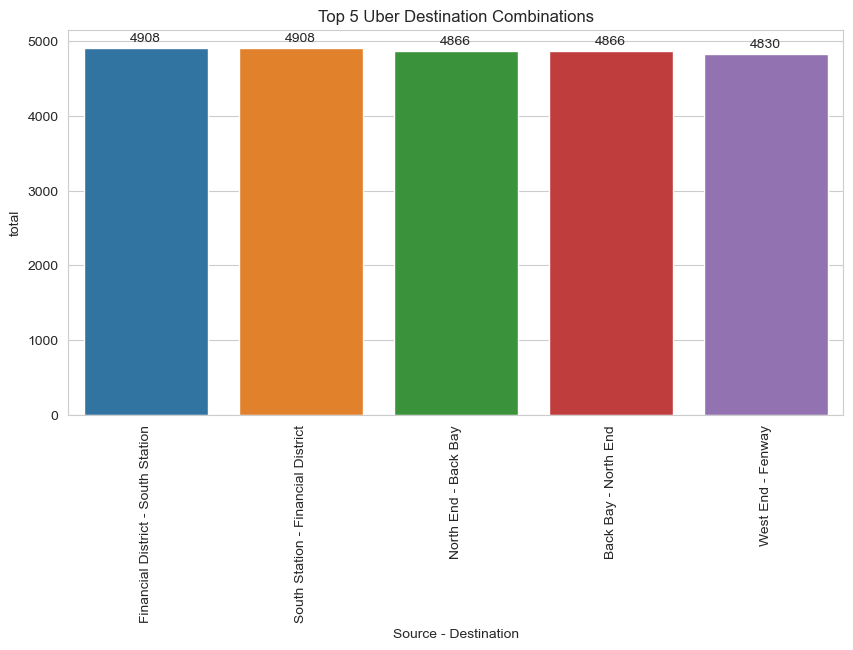

In [36]:
# Calculate the total for each source-destination combination
uber_top5 = uber.groupby(['source', 'destination']).size().reset_index()
uber_top5.columns = ['source', 'destination', 'total']
uber_top5 = uber_top5.sort_values(by='total', ascending=False).head(5)

# Combine source and destination into one column
uber_top5['Source - Destination'] = uber_top5['source'] + ' - ' + uber_top5['destination']
uber_top5 = uber_top5[['Source - Destination', 'total']]

# Create a bar plot
plt.figure(figsize=(10, 5))
ax = sns.barplot(data=uber_top5, x='Source - Destination', y='total')
plt.title("Top 5 Uber Destination Combinations")
plt.xticks(rotation=90)

# Display the counts above each bar
for i in ax.patches:
    ax.annotate(format(i.get_height(), '0.0f'), (i.get_x() + i.get_width() / 2., i.get_height()),
                ha='center', va='center', xytext=(0, 7), textcoords='offset points')

plt.show()

**Kesimpulan:**

Di atas, kami menghitung total perpaduan sumber (source) dan tujuan (destination) perjalanan Uber yang paling umum. Data tersebut kemudian disajikan dalam bar plot untuk menampilkan lima kombinasi asal dan tujuan teratas yang paling sering digunakan.

Dari bar plot di atas dapat disimpulkan `5 Tempat Tujuan yang paling sering dipesan oleh pengguna Uber`, yaitu :
1. Financial District - South Station
2. South Station - Financial District
3. Nort End - Back Bay
4. Back Bay - North End
5. West End - Fenway

### Lyft
Mencari harga tarif Lyft dengan membandingkan jarak (distance) dengan harga (price) dari layanan Lyft, dengan menggunakan kelipatan surge (surge_multiplier)

Text(0.5, 1.0, 'Lyft: Distance - Price')

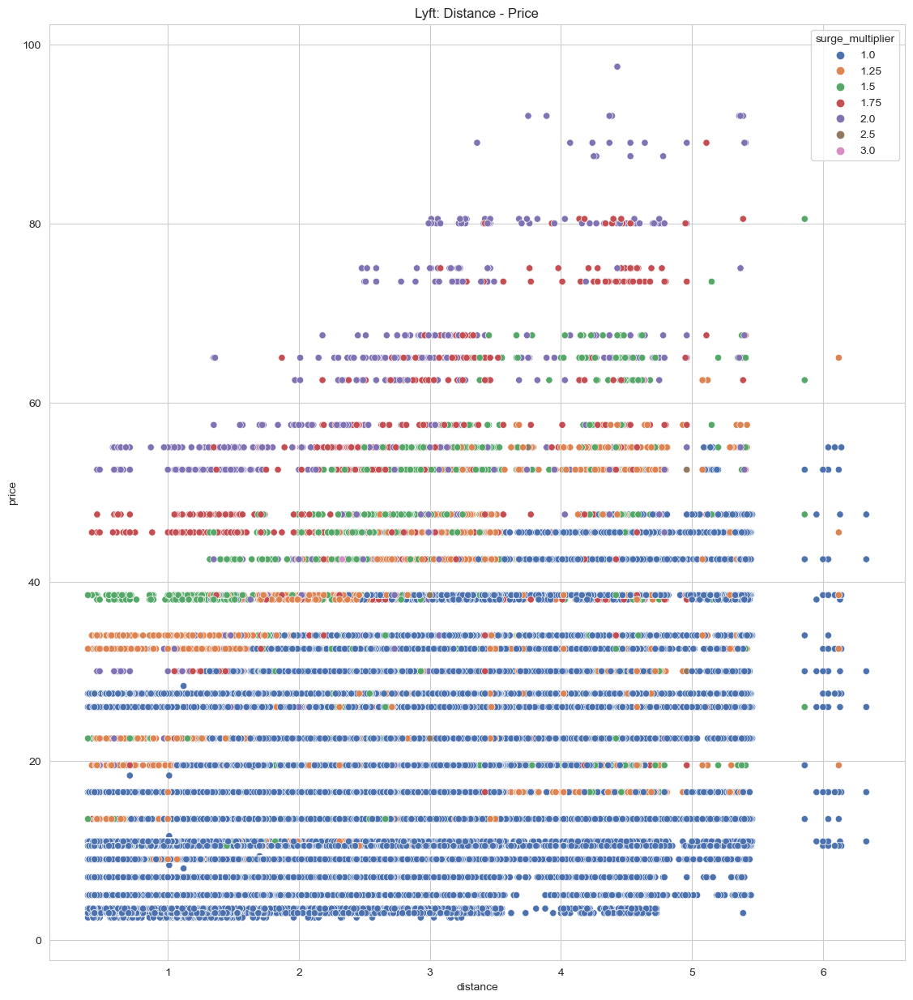

In [37]:
# Filter the DataFrame according to the columns you need
lyft_sm_dis_price = lyft[['distance', 'surge_multiplier', 'price']]

# Plot using a scatter plot
plt.figure(figsize=(30, 15))
plt.subplot(121)
sns.scatterplot(data=lyft_sm_dis_price, x='distance', y='price', hue='surge_multiplier', palette='deep')
plt.title('Lyft: Distance - Price')

**Kesimpulan:**

Scatter plot menggambarkan hubungan antara jarak perjalanan dengan harga, sambil mempertimbangkan pengaruh pengganda lonjakan pada warna titik-titik data. Grafik ini memvisualisasikan hubungan antara jarak perjalanan dan harga, serta dampak pengganda lonjakan pada perbedaan warna pada setiap titik data. Dengan melihat grafik ini, kita dapat mengevaluasi bagaimana harga Lyft bervariasi sehubungan dengan jarak perjalanan dan pengganda lonjakan. Berdasarkan grafik di atas, dapat disimpulkan bahwa `secara signifikan jika distance bertambah maka price juga ikut bertambah`. Diketahui juga bahwa dengan `harga tertinggi maka lebih banuak juga surge multiplier yang juga bertambah`.

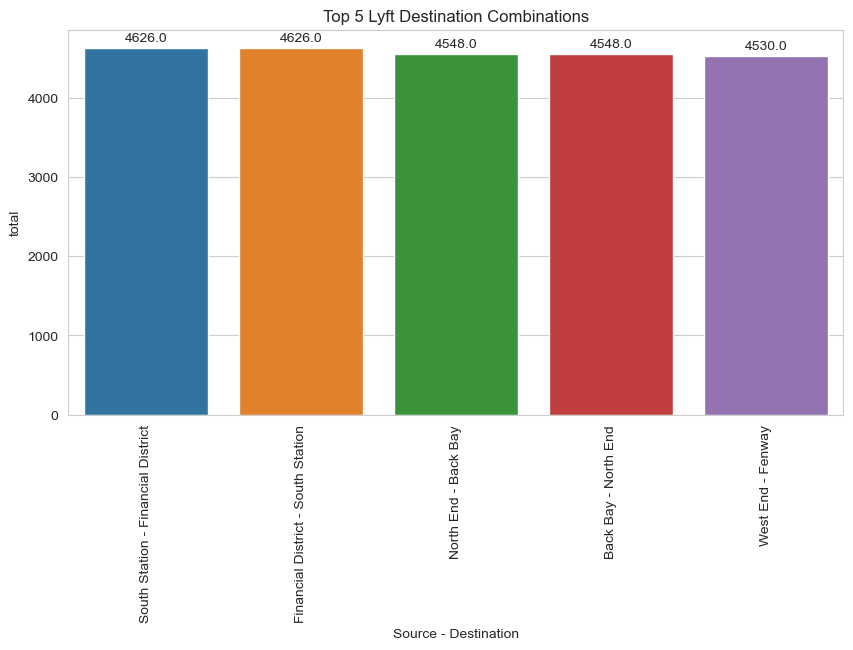

In [38]:
# Calculate the total for each source-destination combination
lyft_top5 = lyft.groupby(['source', 'destination']).size().reset_index()
lyft_top5.columns = ['source', 'destination', 'total']
lyft_top5 = lyft_top5.sort_values(by='total', ascending=False).head(5)

# Combine source and destination into one column
lyft_top5['Source - Destination'] = lyft_top5['source'] + ' - ' + lyft_top5['destination']
lyft_top5 = lyft_top5[['Source - Destination', 'total']]

# Create a bar plot
plt.figure(figsize=(10, 5))
ax = sns.barplot(data=lyft_top5, x='Source - Destination', y='total')
plt.title("Top 5 Lyft Destination Combinations")
plt.xticks(rotation=90)

# Display the counts above each bar
for i in ax.patches:
    ax.annotate(format(i.get_height(), '0.1f'), (i.get_x() + i.get_width() / 2., i.get_height()),
                ha='center', va='center', xytext=(0, 7), textcoords='offset points')

plt.show()

**Kesimpulan:**

Di atas, kami menghitung total perpaduan sumber (source) dan tujuan (destination) perjalanan Lyft yang paling umum. Data tersebut kemudian disajikan dalam bar plot untuk menampilkan lima kombinasi asal dan tujuan teratas yang paling sering digunakan.

Dari bar plot di atas dapat disimpulkan `5 Tempat Tujuan yang paling sering dipesan oleh pengguna Lyft`, yaitu :
1. South Station - Financial District
2. Financial District - South Station
3. Nort End - Back Bay
4. Back Bay - North End
5. West End - Fenway

# **Data Preprocessing**
Data preprocessing refers to the initial steps taken to clean, transform, and organize raw data before it can be effectively utilized for analysis or machine learning.
<hr>

In [39]:
# Show 5 column from the top 
df.head()

,hour,day,month,source,destination,cab_type,name,price,distance,surge_multiplier,short_summary,icon
0,9,16,12,Haymarket Square,North Station,Lyft,Shared,5.0,0.44,1.0,Mostly Cloudy,partly-cloudy-night
1,2,27,11,Haymarket Square,North Station,Lyft,Lux,11.0,0.44,1.0,Rain,rain
2,1,28,11,Haymarket Square,North Station,Lyft,Lyft,7.0,0.44,1.0,Clear,clear-night
3,4,30,11,Haymarket Square,North Station,Lyft,Lux Black XL,26.0,0.44,1.0,Clear,clear-night
4,3,29,11,Haymarket Square,North Station,Lyft,Lyft XL,9.0,0.44,1.0,Partly Cloudy,partly-cloudy-night


In [40]:
# View dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 637976 entries, 0 to 637975
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   hour              637976 non-null  int64  
 1   day               637976 non-null  int64  
 2   month             637976 non-null  int64  
 3   source            637976 non-null  object 
 4   destination       637976 non-null  object 
 5   cab_type          637976 non-null  object 
 6   name              637976 non-null  object 
 7   price             637976 non-null  float64
 8   distance          637976 non-null  float64
 9   surge_multiplier  637976 non-null  float64
 10  short_summary     637976 non-null  object 
 11  icon              637976 non-null  object 
dtypes: float64(3), int64(3), object(6)
memory usage: 58.4+ MB


In [41]:
# Perform binary encoding on the 'cab_type' column
df['cab_type'] = df['cab_type'].replace({'Lyft': 0, 'Uber': 1})

In [42]:
# Convert categorical variables into binary representations that can be used in data analysis or modeling using One-Hot Encoding
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Initialize OneHotEncoder and merge the original dataframe with the encoded columns into the dataframe
for col in categorical_cols:
    encoder = OneHotEncoder(handle_unknown='ignore')
    # Create a new DataFrame (encoder_df) from the encoding result.
    encoder_df = pd.DataFrame(encoder.fit_transform(df[[col]]).toarray())
    # Rename the encoded columns
    encoder_df.columns = encoder.get_feature_names_out([col])
    # Drop the original column from the DataFrame
    df = df.drop(col, axis=1)
    # Concatenate the original DataFrame with the encoded DataFrame
    df = pd.concat([df, encoder_df], axis=1)

In [43]:
df.head()

,hour,day,month,cab_type,price,distance,surge_multiplier,source_Back Bay,source_Beacon Hill,source_Boston University,...,short_summary_ Partly Cloudy,short_summary_ Possible Drizzle,short_summary_ Rain,icon_ clear-day,icon_ clear-night,icon_ cloudy,icon_ fog,icon_ partly-cloudy-day,icon_ partly-cloudy-night,icon_ rain
0,9,16,12,0,5.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,2,27,11,0,11.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1,28,11,0,7.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,4,30,11,0,26.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,3,29,11,0,9.0,0.44,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


## Check for Correlation

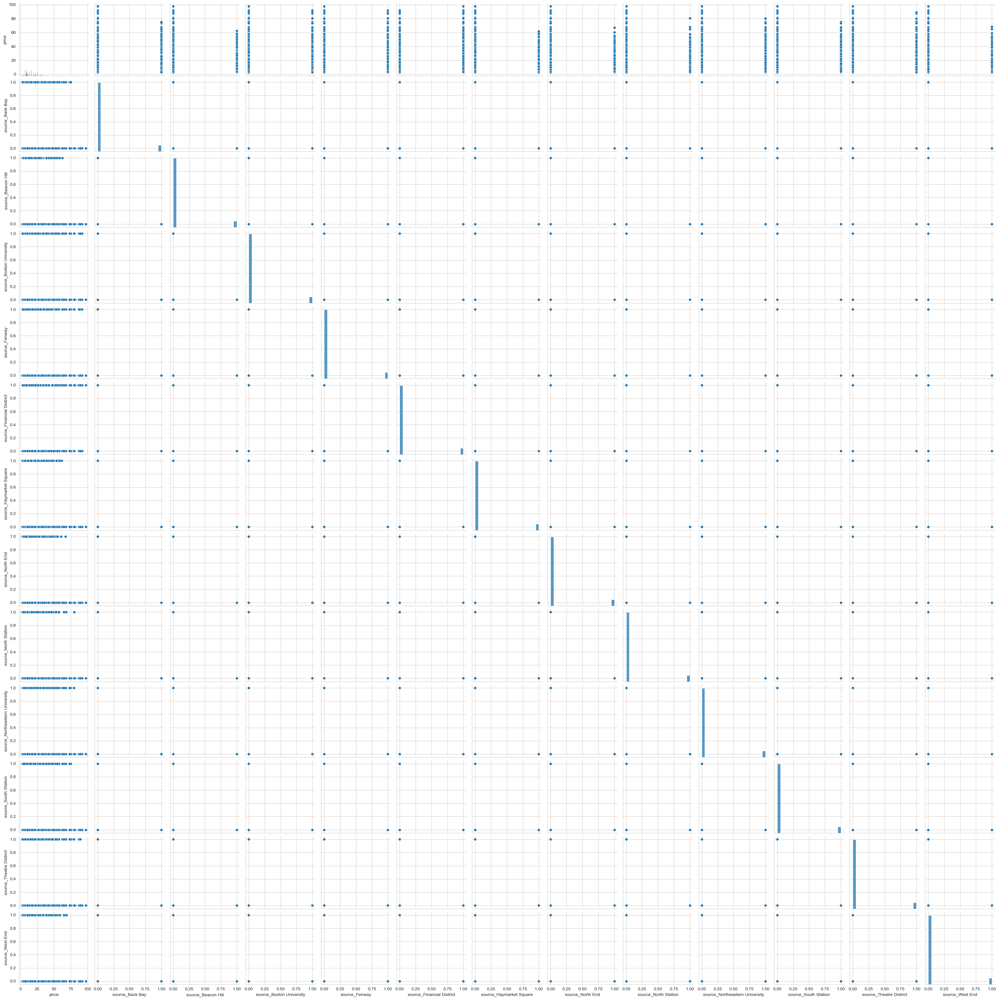

In [44]:
# Check the correlation between the 'price' feature and features related to the source
source_cols = df[['price', 'source_Back Bay', 'source_Beacon Hill', 'source_Boston University', 'source_Fenway',
                'source_Financial District', 'source_Haymarket Square', 'source_North End', 'source_North Station',
                'source_Northeastern University', 'source_South Station', 'source_Theatre District',
                'source_West End']]
source_cols.head()

# Display visualization using a pairplot
sns.pairplot(source_cols)
plt.show()

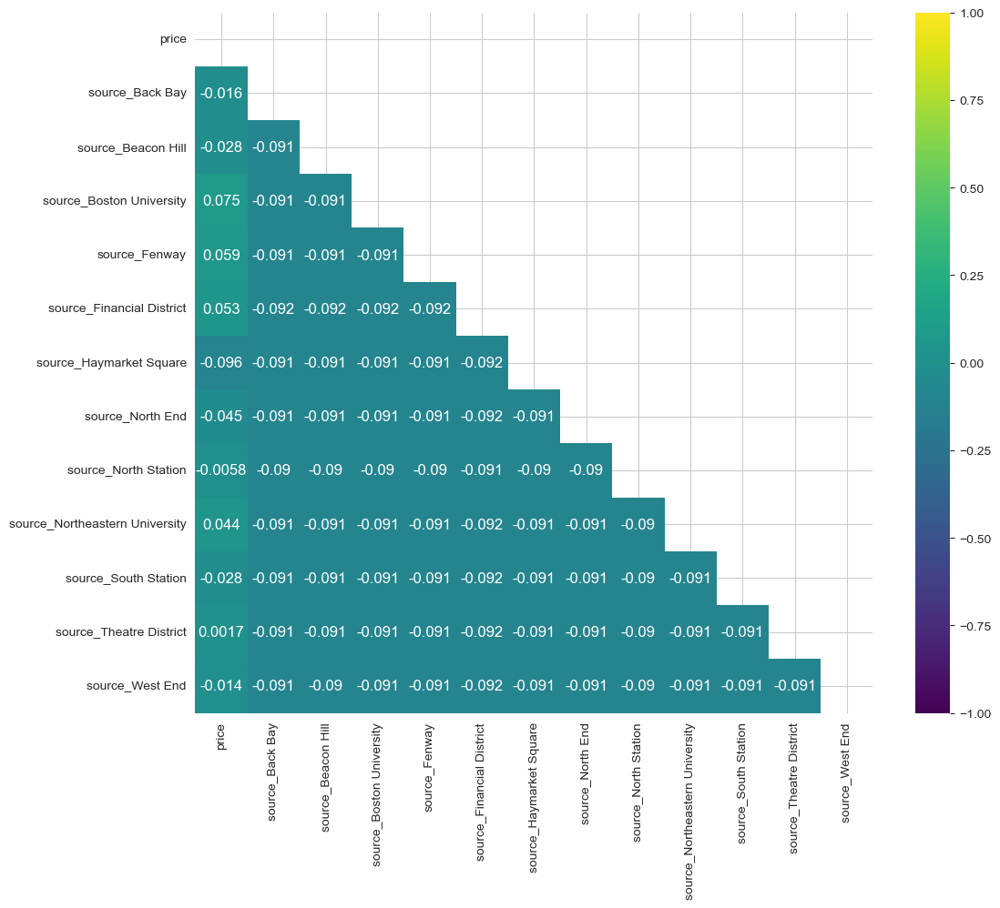

In [45]:
source_cols = df[['price', 'source_Back Bay', 'source_Beacon Hill', 'source_Boston University', 'source_Fenway',
                'source_Financial District', 'source_Haymarket Square', 'source_North End', 'source_North Station',
                'source_Northeastern University', 'source_South Station', 'source_Theatre District',
                'source_West End']]

# Create a correlation matrix
correlation_mat = source_cols.corr()

# Create a mask
mask = np.triu(np.ones_like(correlation_mat, dtype=bool))

# Set the figure size
plt.figure(figsize=(12, 10))

# Create a heatmap
sns.heatmap(correlation_mat,
            vmax=1, vmin=-1,
            annot=True, annot_kws={'fontsize': 12},
            mask=mask,
            cmap="viridis")
plt.show()

In [46]:
alpha = 0.05  # Level of significance

# Create lists to store significant and non-significant correlations
significant_positive_correlations = []
significant_negative_correlations = []
non_significant_correlations = []

# Loop through each source-related feature and calculate correlation and p-value
for feature in source_cols.columns[1:]:
    correlation, p_value = stats.pearsonr(source_cols['price'], source_cols[feature])
    if p_value < alpha:
        if correlation > 0:
            significant_positive_correlations.append((feature, correlation, p_value))
        else:
            significant_negative_correlations.append((feature, correlation, p_value))
    else:
        non_significant_correlations.append((feature, correlation, p_value))

# Print significant positive correlations
print("Significant Positive Correlations:")
for feature, correlation, p_value in significant_positive_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

# Print significant negative correlations
print("Significant Negative Correlations:")
for feature, correlation, p_value in significant_negative_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

# Print non-significant correlations
print("Non-Significant Correlations:")
for feature, correlation, p_value in non_significant_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

Significant Positive Correlations:
Feature: source_Boston University
Correlation with Price: 0.0746
P-value: 0.0000
----------------------------------------
Feature: source_Fenway
Correlation with Price: 0.0593
P-value: 0.0000
----------------------------------------
Feature: source_Financial District
Correlation with Price: 0.0535
P-value: 0.0000
----------------------------------------
Feature: source_Northeastern University
Correlation with Price: 0.0438
P-value: 0.0000
----------------------------------------
Significant Negative Correlations:
Feature: source_Back Bay
Correlation with Price: -0.0161
P-value: 0.0000
----------------------------------------
Feature: source_Beacon Hill
Correlation with Price: -0.0284
P-value: 0.0000
----------------------------------------
Feature: source_Haymarket Square
Correlation with Price: -0.0959
P-value: 0.0000
----------------------------------------
Feature: source_North End
Correlation with Price: -0.0450
P-value: 0.0000
-------------------

### Uji Hipotesis
**Hipotesis:**
- Hipotesis Nol (Ho): Hipotesis bahwa tidak ada hubungan atau efek yang signifikan.
- Hipotesis Alternatif (Ha): Hipotesis bahwa ada hubungan atau efek yang signifikan.

**Taraf Signifikansi:**
alpha = 5%

**Statistik Uji dan Daerah Kritis:**

P-value adalah ukuran statistik yang digunakan untuk menilai sejauh mana data mendukung atau tidak mendukung hipotesis nol.
- Jika p-value lebih besar dari tingkat signifikansi yang telah ditentukan (0.05 atau 5%), maka tidak memiliki cukup bukti untuk menolak hipotesis nol. Ini berarti dapat disimpulkan adanya hubungan atau efek yang signifikan.
- Jika p-value lebih kecil dari tingkat signifikansi yang telah ditentukan (0.05 atau 5%), maka memiliki cukup bukti untuk menolak hipotesis nol. Ini berarti dapat disimpulkan adanya hubungan atau efek yang signifikan dan menerima hipotesis alternatif.

**Kesimpulan:**

Berdasarkan output di atas, pada taraf signifikansi alpha = 5% diperoleh nilai P-value di bawah alpha. Maka dapat disimpulkan bahwa `source berpengaruh terhadap price`.

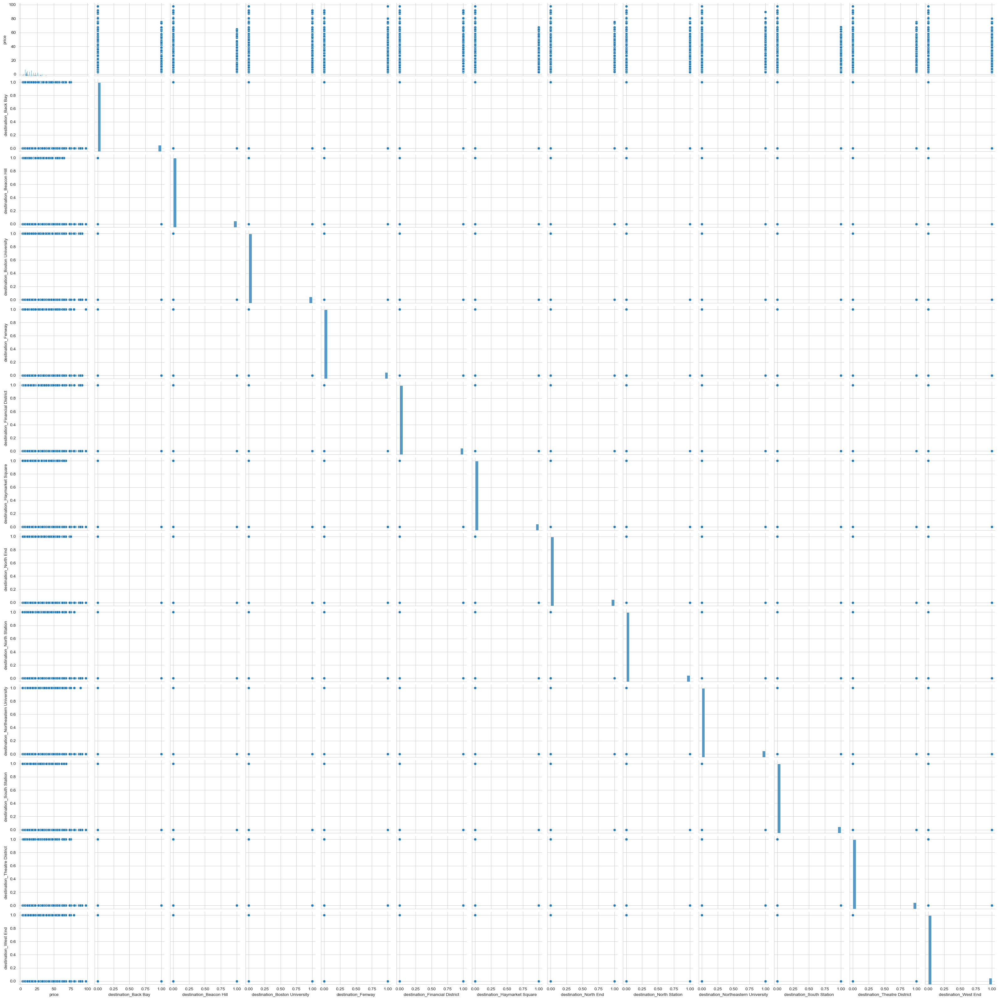

In [47]:
# Check the correlation between the 'price' feature and features related to the destination
destination_cols = df[['price', 'destination_Back Bay', 'destination_Beacon Hill', 'destination_Boston University',
                    'destination_Fenway', 'destination_Financial District', 'destination_Haymarket Square',
                    'destination_North End', 'destination_North Station', 'destination_Northeastern University',
                    'destination_South Station', 'destination_Theatre District', 'destination_West End']]
destination_cols.head()

# Display visualization using a pairplot
sns.pairplot(destination_cols)
plt.show()

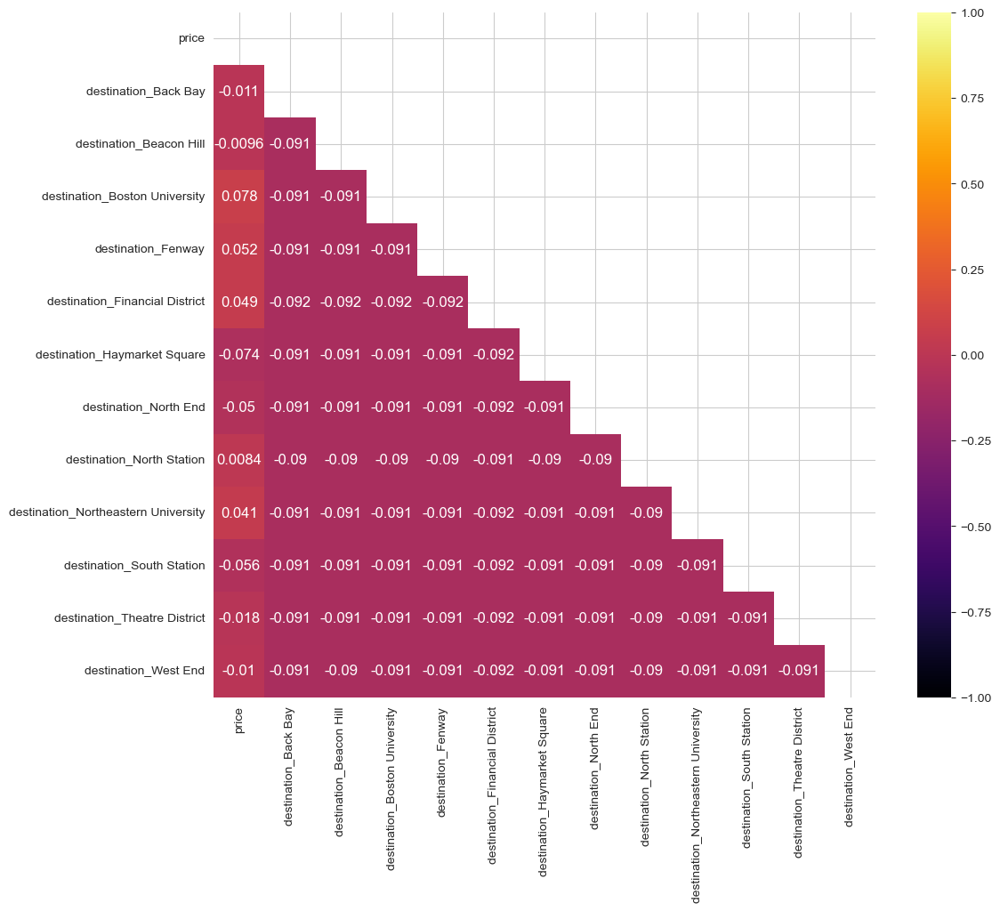

In [48]:
destination_cols = df[['price', 'destination_Back Bay', 'destination_Beacon Hill', 'destination_Boston University',
                    'destination_Fenway', 'destination_Financial District', 'destination_Haymarket Square',
                    'destination_North End', 'destination_North Station', 'destination_Northeastern University',
                    'destination_South Station', 'destination_Theatre District', 'destination_West End']]

# Create a correlation matrix
correlation_mat = destination_cols.corr()

# Create a mask
mask = np.triu(np.ones_like(correlation_mat, dtype=bool))

# Set the figure size
plt.figure(figsize=(12, 10))

# Create a heatmap
sns.heatmap(correlation_mat,
            vmax=1, vmin=-1,
            annot=True, annot_kws={'fontsize': 12},
            mask=mask,
            cmap="inferno")
plt.show()

In [49]:
alpha = 0.05  # Level of significance

# Create lists to store significant and non-significant correlations
significant_positive_correlations = []
significant_negative_correlations = []
non_significant_correlations = []

# Loop through each source-related feature and calculate correlation and p-value
for feature in destination_cols.columns[1:]:
    correlation, p_value = stats.pearsonr(destination_cols['price'], destination_cols[feature])
    if p_value < alpha:
        if correlation > 0:
            significant_positive_correlations.append((feature, correlation, p_value))
        else:
            significant_negative_correlations.append((feature, correlation, p_value))
    else:
        non_significant_correlations.append((feature, correlation, p_value))

# Print significant positive correlations
print("Significant Positive Correlations:")
for feature, correlation, p_value in significant_positive_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

# Print significant negative correlations
print("Significant Negative Correlations:")
for feature, correlation, p_value in significant_negative_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

# Print non-significant correlations
print("Non-Significant Correlations:")
for feature, correlation, p_value in non_significant_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

Significant Positive Correlations:
Feature: destination_Boston University
Correlation with Price: 0.0775
P-value: 0.0000
----------------------------------------
Feature: destination_Fenway
Correlation with Price: 0.0518
P-value: 0.0000
----------------------------------------
Feature: destination_Financial District
Correlation with Price: 0.0491
P-value: 0.0000
----------------------------------------
Feature: destination_North Station
Correlation with Price: 0.0084
P-value: 0.0000
----------------------------------------
Feature: destination_Northeastern University
Correlation with Price: 0.0415
P-value: 0.0000
----------------------------------------
Significant Negative Correlations:
Feature: destination_Back Bay
Correlation with Price: -0.0108
P-value: 0.0000
----------------------------------------
Feature: destination_Beacon Hill
Correlation with Price: -0.0096
P-value: 0.0000
----------------------------------------
Feature: destination_Haymarket Square
Correlation with Price: 

### Uji Hipotesis
**Hipotesis:**
- Hipotesis Nol (Ho): Hipotesis bahwa tidak ada hubungan atau efek yang signifikan.
- Hipotesis Alternatif (Ha): Hipotesis bahwa ada hubungan atau efek yang signifikan.

**Taraf Signifikansi:**
alpha = 5%

**Statistik Uji dan Daerah Kritis:**

P-value adalah ukuran statistik yang digunakan untuk menilai sejauh mana data mendukung atau tidak mendukung hipotesis nol.
- Jika p-value lebih besar dari tingkat signifikansi yang telah ditentukan (0.05 atau 5%), maka tidak memiliki cukup bukti untuk menolak hipotesis nol. Ini berarti dapat disimpulkan adanya hubungan atau efek yang signifikan.
- Jika p-value lebih kecil dari tingkat signifikansi yang telah ditentukan (0.05 atau 5%), maka memiliki cukup bukti untuk menolak hipotesis nol. Ini berarti dapat disimpulkan adanya hubungan atau efek yang signifikan dan menerima hipotesis alternatif.

**Kesimpulan:**

Berdasarkan output di atas, pada taraf signifikansi alpha = 5% diperoleh nilai P-value di bawah alpha. Maka dapat disimpulkan bahwa `destination berpengaruh terhadap price`.

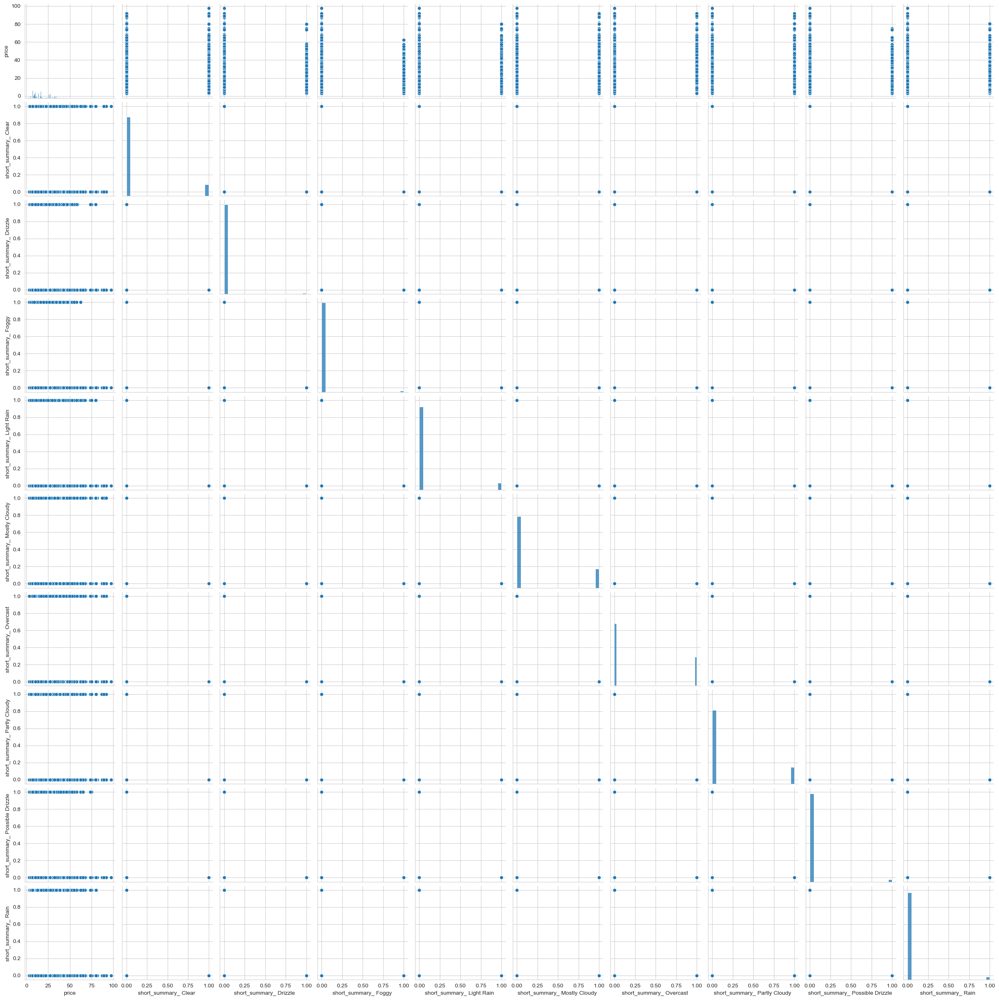

In [50]:
# Check the correlation between the 'price' feature and features related to the summary
summary_cols = df[['price', 'short_summary_ Clear ', 'short_summary_ Drizzle ', 'short_summary_ Foggy ',
                'short_summary_ Light Rain ', 'short_summary_ Mostly Cloudy ', 'short_summary_ Overcast ',
                'short_summary_ Partly Cloudy ', 'short_summary_ Possible Drizzle ', 'short_summary_ Rain ']]
summary_cols.head()

# Display visualization using a pairplot
sns.pairplot(summary_cols)
plt.show()

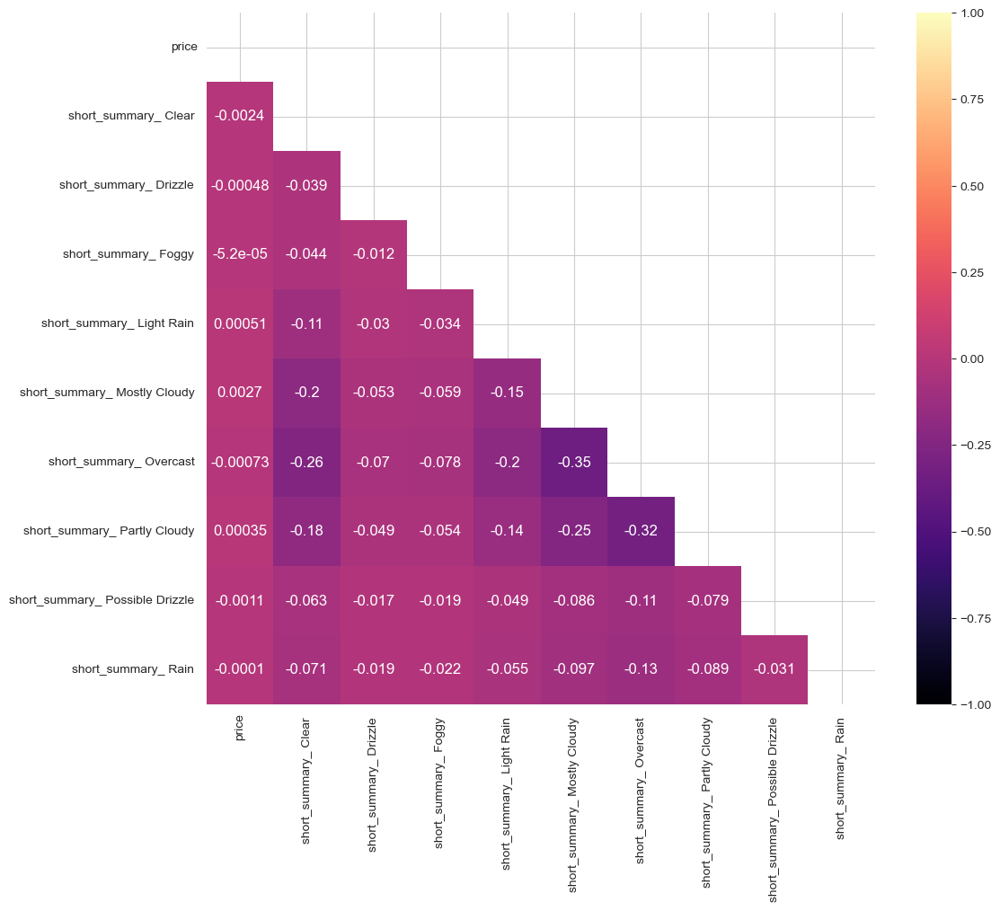

In [51]:
summary_cols = df[['price', 'short_summary_ Clear ', 'short_summary_ Drizzle ', 'short_summary_ Foggy ',
                'short_summary_ Light Rain ', 'short_summary_ Mostly Cloudy ', 'short_summary_ Overcast ',
                'short_summary_ Partly Cloudy ', 'short_summary_ Possible Drizzle ', 'short_summary_ Rain ']]

# Create a correlation matrix
correlation_mat = summary_cols.corr()

# Create a mask
mask = np.triu(np.ones_like(correlation_mat, dtype=bool))

# Set the figure size
plt.figure(figsize=(12, 10))

# Create a heatmap
sns.heatmap(correlation_mat,
            vmax=1, vmin=-1,
            annot=True, annot_kws={'fontsize': 12},
            mask=mask,
            cmap="magma")
plt.show()

In [52]:
alpha = 0.05  # Level of significance

# Create lists to store significant and non-significant correlations
significant_positive_correlations = []
significant_negative_correlations = []
non_significant_correlations = []

# Loop through each source-related feature and calculate correlation and p-value
for feature in summary_cols.columns[1:]:
    correlation, p_value = stats.pearsonr(summary_cols['price'], summary_cols[feature])
    if p_value < alpha:
        if correlation > 0:
            significant_positive_correlations.append((feature, correlation, p_value))
        else:
            significant_negative_correlations.append((feature, correlation, p_value))
    else:
        non_significant_correlations.append((feature, correlation, p_value))

# Print significant positive correlations
print("Significant Positive Correlations:")
for feature, correlation, p_value in significant_positive_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

# Print significant negative correlations
print("Significant Negative Correlations:")
for feature, correlation, p_value in significant_negative_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

# Print non-significant correlations
print("Non-Significant Correlations:")
for feature, correlation, p_value in non_significant_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

Significant Positive Correlations:
Feature: short_summary_ Mostly Cloudy 
Correlation with Price: 0.0027
P-value: 0.0290
----------------------------------------
Significant Negative Correlations:
Non-Significant Correlations:
Feature: short_summary_ Clear 
Correlation with Price: -0.0024
P-value: 0.0566
----------------------------------------
Feature: short_summary_ Drizzle 
Correlation with Price: -0.0005
P-value: 0.7016
----------------------------------------
Feature: short_summary_ Foggy 
Correlation with Price: -0.0001
P-value: 0.9667
----------------------------------------
Feature: short_summary_ Light Rain 
Correlation with Price: 0.0005
P-value: 0.6850
----------------------------------------
Feature: short_summary_ Overcast 
Correlation with Price: -0.0007
P-value: 0.5603
----------------------------------------
Feature: short_summary_ Partly Cloudy 
Correlation with Price: 0.0004
P-value: 0.7796
----------------------------------------
Feature: short_summary_ Possible Driz

### Uji Hipotesis
**Hipotesis:**
- Hipotesis Nol (Ho): Hipotesis bahwa tidak ada hubungan atau efek yang signifikan.
- Hipotesis Alternatif (Ha): Hipotesis bahwa ada hubungan atau efek yang signifikan.

**Taraf Signifikansi:**
alpha = 5%

**Statistik Uji dan Daerah Kritis:**

P-value adalah ukuran statistik yang digunakan untuk menilai sejauh mana data mendukung atau tidak mendukung hipotesis nol.
- Jika p-value lebih besar dari tingkat signifikansi yang telah ditentukan (0.05 atau 5%), maka tidak memiliki cukup bukti untuk menolak hipotesis nol. Ini berarti dapat disimpulkan adanya hubungan atau efek yang signifikan.
- Jika p-value lebih kecil dari tingkat signifikansi yang telah ditentukan (0.05 atau 5%), maka memiliki cukup bukti untuk menolak hipotesis nol. Ini berarti dapat disimpulkan adanya hubungan atau efek yang signifikan dan menerima hipotesis alternatif.

**Kesimpulan:**

Berdasarkan output di atas, pada taraf signifikansi alpha = 5% diperoleh nilai P-value di atas alpha. Maka dapat disimpulkan bahwa `short summary tidak berpengaruh terhadap price` sehingga kita menghapus rows tersebut.

In [53]:
# Removing all features related to summary from the dataframe because they have weak correlations with the target feature (price)
summary_cols = ['short_summary_ Clear ','short_summary_ Drizzle ', 'short_summary_ Foggy ',
                'short_summary_ Light Rain ', 'short_summary_ Mostly Cloudy ','short_summary_ Overcast ',
                'short_summary_ Partly Cloudy ','short_summary_ Possible Drizzle ', 'short_summary_ Rain ']
df = df.drop(summary_cols, axis=1)
print(df.shape)
df.head()

(637976, 50)


,hour,day,month,cab_type,price,distance,surge_multiplier,source_Back Bay,source_Beacon Hill,source_Boston University,...,name_UberX,name_UberXL,name_WAV,icon_ clear-day,icon_ clear-night,icon_ cloudy,icon_ fog,icon_ partly-cloudy-day,icon_ partly-cloudy-night,icon_ rain
0,9,16,12,0,5.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,2,27,11,0,11.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1,28,11,0,7.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,4,30,11,0,26.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,3,29,11,0,9.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


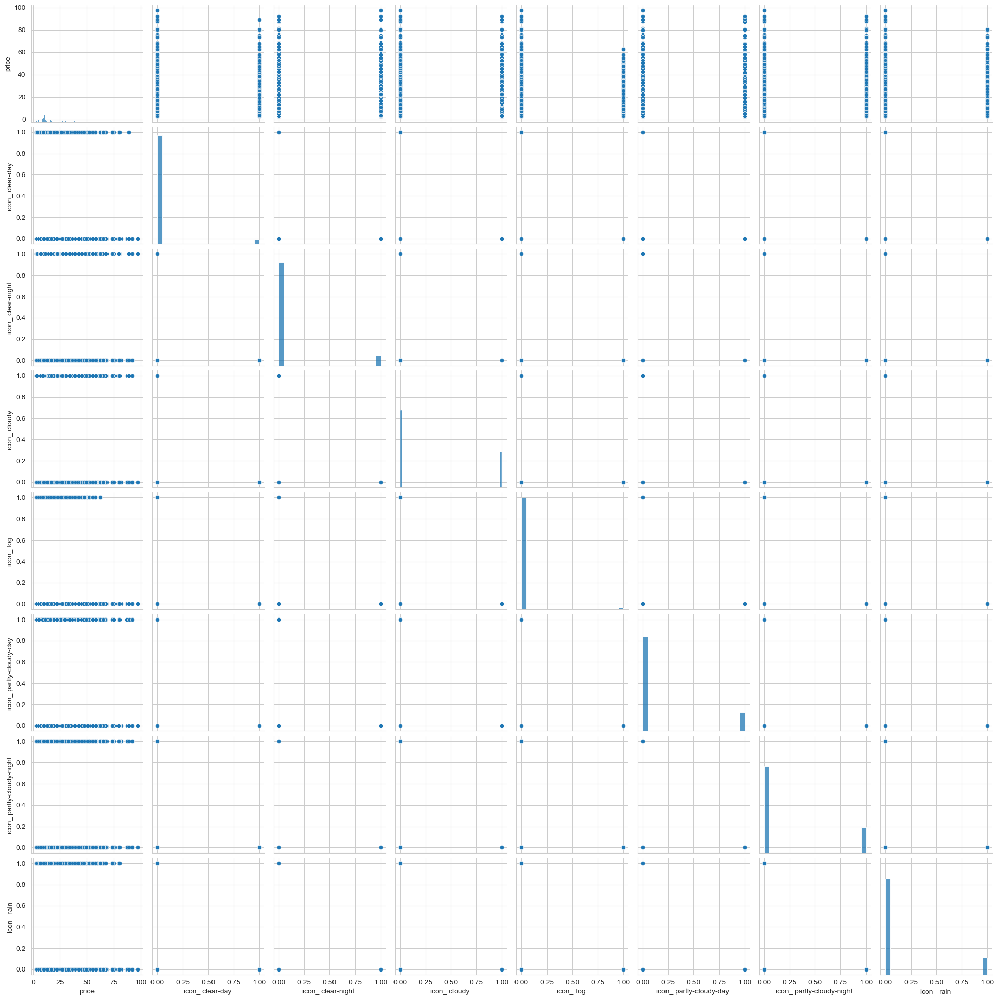

In [54]:
# Checking the correlation between the 'price' feature and features related to the weather icon
icon_cols = df[['price','icon_ clear-day ', 'icon_ clear-night ', 'icon_ cloudy ', 'icon_ fog ','icon_ partly-cloudy-day ',
            'icon_ partly-cloudy-night ','icon_ rain ']]
icon_cols.head()

# Display visualization using a pairplot
sns.pairplot(icon_cols)
plt.show()

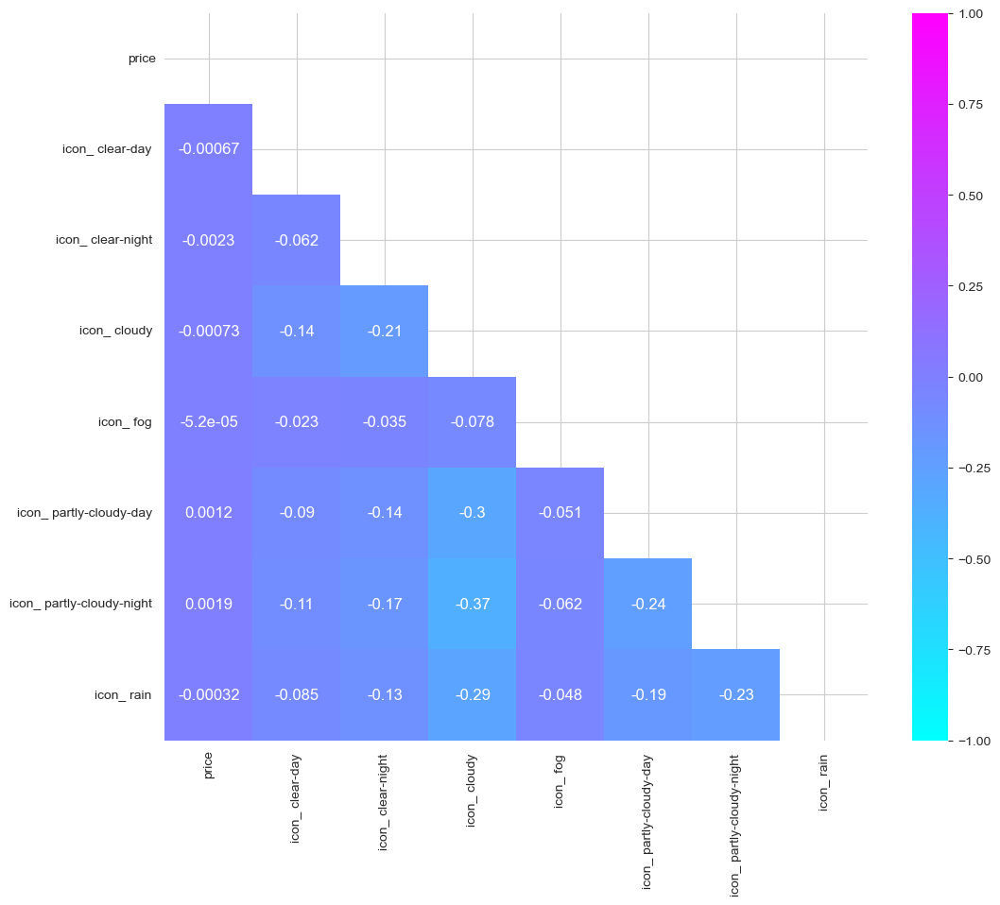

In [55]:
icon_cols = df[['price','icon_ clear-day ', 'icon_ clear-night ', 'icon_ cloudy ', 'icon_ fog ','icon_ partly-cloudy-day ',
            'icon_ partly-cloudy-night ','icon_ rain ']]

# Create a correlation matrix
correlation_mat = icon_cols.corr()

# Create a mask
mask = np.triu(np.ones_like(correlation_mat, dtype=bool))

# Set the figure size
plt.figure(figsize=(12, 10))

# Create a heatmap
sns.heatmap(correlation_mat,
            vmax=1, vmin=-1,
            annot=True, annot_kws={'fontsize': 12},
            mask=mask,
            cmap="cool")
plt.show()

In [56]:
alpha = 0.05  # Level of significance

# Create lists to store significant and non-significant correlations
significant_positive_correlations = []
significant_negative_correlations = []
non_significant_correlations = []

# Loop through each source-related feature and calculate correlation and p-value
for feature in icon_cols.columns[1:]:
    correlation, p_value = stats.pearsonr(icon_cols['price'], icon_cols[feature])
    if p_value < alpha:
        if correlation > 0:
            significant_positive_correlations.append((feature, correlation, p_value))
        else:
            significant_negative_correlations.append((feature, correlation, p_value))
    else:
        non_significant_correlations.append((feature, correlation, p_value))

# Print significant positive correlations
print("Significant Positive Correlations:")
for feature, correlation, p_value in significant_positive_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

# Print significant negative correlations
print("Significant Negative Correlations:")
for feature, correlation, p_value in significant_negative_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

# Print non-significant correlations
print("Non-Significant Correlations:")
for feature, correlation, p_value in non_significant_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

Significant Positive Correlations:
Significant Negative Correlations:
Non-Significant Correlations:
Feature: icon_ clear-day 
Correlation with Price: -0.0007
P-value: 0.5937
----------------------------------------
Feature: icon_ clear-night 
Correlation with Price: -0.0023
P-value: 0.0605
----------------------------------------
Feature: icon_ cloudy 
Correlation with Price: -0.0007
P-value: 0.5603
----------------------------------------
Feature: icon_ fog 
Correlation with Price: -0.0001
P-value: 0.9667
----------------------------------------
Feature: icon_ partly-cloudy-day 
Correlation with Price: 0.0012
P-value: 0.3506
----------------------------------------
Feature: icon_ partly-cloudy-night 
Correlation with Price: 0.0019
P-value: 0.1206
----------------------------------------
Feature: icon_ rain 
Correlation with Price: -0.0003
P-value: 0.7979
----------------------------------------


### Uji Hipotesis
**Hipotesis:**
- Hipotesis Nol (Ho): Hipotesis bahwa tidak ada hubungan atau efek yang signifikan.
- Hipotesis Alternatif (Ha): Hipotesis bahwa ada hubungan atau efek yang signifikan.

**Taraf Signifikansi:**
alpha = 5%

**Statistik Uji dan Daerah Kritis:**

P-value adalah ukuran statistik yang digunakan untuk menilai sejauh mana data mendukung atau tidak mendukung hipotesis nol.
- Jika p-value lebih besar dari tingkat signifikansi yang telah ditentukan (0.05 atau 5%), maka tidak memiliki cukup bukti untuk menolak hipotesis nol. Ini berarti dapat disimpulkan adanya hubungan atau efek yang signifikan.
- Jika p-value lebih kecil dari tingkat signifikansi yang telah ditentukan (0.05 atau 5%), maka memiliki cukup bukti untuk menolak hipotesis nol. Ini berarti dapat disimpulkan adanya hubungan atau efek yang signifikan dan menerima hipotesis alternatif.

**Kesimpulan:**

Berdasarkan output di atas, pada taraf signifikansi alpha = 5% diperoleh nilai P-value di atas alpha. Maka dapat disimpulkan bahwa `icon tidak berpengaruh terhadap price` sehingga kita menghapus rows tersebut.

In [57]:
# Removing all features related to the weather icon from the dataframe because they have weak correlation with the target feature (price)
icon_cols = ['icon_ clear-day ', 'icon_ clear-night ', 'icon_ cloudy ', 'icon_ fog ','icon_ partly-cloudy-day ',
            'icon_ partly-cloudy-night ','icon_ rain ']
df = df.drop(icon_cols, axis=1)
print(df.shape)
df.head()

(637976, 43)


,hour,day,month,cab_type,price,distance,surge_multiplier,source_Back Bay,source_Beacon Hill,source_Boston University,...,name_Lux,name_Lux Black,name_Lux Black XL,name_Lyft,name_Lyft XL,name_Shared,name_UberPool,name_UberX,name_UberXL,name_WAV
0,9,16,12,0,5.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,2,27,11,0,11.0,0.44,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1,28,11,0,7.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,30,11,0,26.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,3,29,11,0,9.0,0.44,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


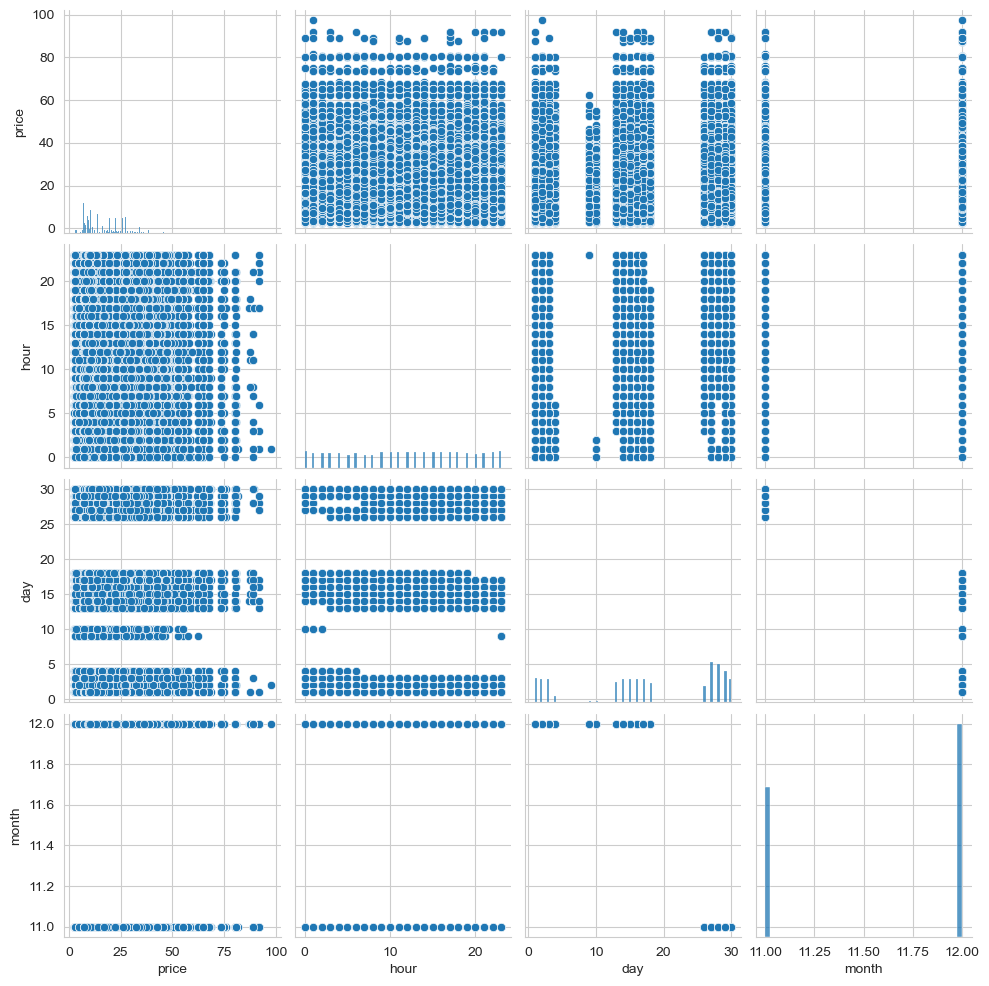

In [58]:
# Checking the correlation between the 'price' feature and features related to time
times_cols = df[['price','hour', 'day', 'month']]
times_cols.head()

# Display visualization using a pairplot
sns.pairplot(times_cols)
plt.show()

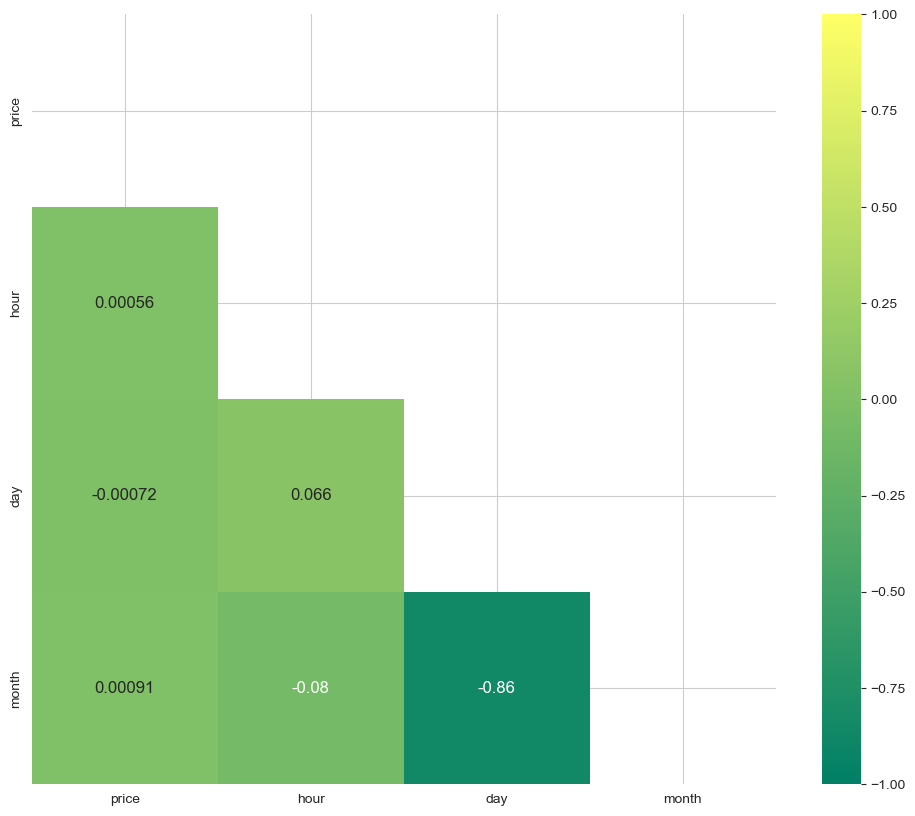

In [59]:
times_cols = df[['price','hour', 'day', 'month']]

# Create a correlation matrix
correlation_mat = times_cols.corr()

# Create a mask
mask = np.triu(np.ones_like(correlation_mat, dtype=bool))

# Set the figure size
plt.figure(figsize=(12, 10))

# Create a heatmap
sns.heatmap(correlation_mat,
            vmax=1, vmin=-1,
            annot=True, annot_kws={'fontsize': 12},
            mask=mask,
            cmap="summer")
plt.show()

In [60]:
alpha = 0.05  # Level of significance

# Create lists to store significant and non-significant correlations
significant_positive_correlations = []
significant_negative_correlations = []
non_significant_correlations = []

# Loop through each source-related feature and calculate correlation and p-value
for feature in times_cols.columns[1:]:
    correlation, p_value = stats.pearsonr(times_cols['price'], times_cols[feature])
    if p_value < alpha:
        if correlation > 0:
            significant_positive_correlations.append((feature, correlation, p_value))
        else:
            significant_negative_correlations.append((feature, correlation, p_value))
    else:
        non_significant_correlations.append((feature, correlation, p_value))

# Print significant positive correlations
print("Significant Positive Correlations:")
for feature, correlation, p_value in significant_positive_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

# Print significant negative correlations
print("Significant Negative Correlations:")
for feature, correlation, p_value in significant_negative_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

# Print non-significant correlations
print("Non-Significant Correlations:")
for feature, correlation, p_value in non_significant_correlations:
    print(f'Feature: {feature}')
    print(f'Correlation with Price: {correlation:.4f}')
    print(f'P-value: {p_value:.4f}')
    print('-' * 40)

Significant Positive Correlations:
Significant Negative Correlations:
Non-Significant Correlations:
Feature: hour
Correlation with Price: 0.0006
P-value: 0.6540
----------------------------------------
Feature: day
Correlation with Price: -0.0007
P-value: 0.5640
----------------------------------------
Feature: month
Correlation with Price: 0.0009
P-value: 0.4656
----------------------------------------


### Uji Hipotesis
**Hipotesis:**
- Hipotesis Nol (Ho): Hipotesis bahwa tidak ada hubungan atau efek yang signifikan.
- Hipotesis Alternatif (Ha): Hipotesis bahwa ada hubungan atau efek yang signifikan.

**Taraf Signifikansi:**
alpha = 5%

**Statistik Uji dan Daerah Kritis:**

P-value adalah ukuran statistik yang digunakan untuk menilai sejauh mana data mendukung atau tidak mendukung hipotesis nol.
- Jika p-value lebih besar dari tingkat signifikansi yang telah ditentukan (0.05 atau 5%), maka tidak memiliki cukup bukti untuk menolak hipotesis nol. Ini berarti dapat disimpulkan adanya hubungan atau efek yang signifikan.
- Jika p-value lebih kecil dari tingkat signifikansi yang telah ditentukan (0.05 atau 5%), maka memiliki cukup bukti untuk menolak hipotesis nol. Ini berarti dapat disimpulkan adanya hubungan atau efek yang signifikan dan menerima hipotesis alternatif.

**Kesimpulan:**

Berdasarkan output di atas, pada taraf signifikansi alpha = 5% diperoleh nilai P-value di atas alpha. Maka dapat disimpulkan bahwa `waktu tidak berpengaruh terhadap price` sehingga kita menghapus rows tersebut.

In [61]:
# Removing all time-related features from the dataframe because they have weak correlations with the target feature (price)
times_cols = ['hour', 'day', 'month']
df = df.drop(times_cols, axis=1)
print(df.shape)
df.head()

(637976, 40)


,cab_type,price,distance,surge_multiplier,source_Back Bay,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,...,name_Lux,name_Lux Black,name_Lux Black XL,name_Lyft,name_Lyft XL,name_Shared,name_UberPool,name_UberX,name_UberXL,name_WAV
0,0,5.0,0.44,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0,11.0,0.44,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,7.0,0.44,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,26.0,0.44,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,9.0,0.44,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [62]:
# Check the number of missing values in the dataset
df.isnull().sum()

cab_type                               0
price                                  0
distance                               0
surge_multiplier                       0
source_Back Bay                        0
source_Beacon Hill                     0
source_Boston University               0
source_Fenway                          0
source_Financial District              0
source_Haymarket Square                0
source_North End                       0
source_North Station                   0
source_Northeastern University         0
source_South Station                   0
source_Theatre District                0
source_West End                        0
destination_Back Bay                   0
destination_Beacon Hill                0
destination_Boston University          0
destination_Fenway                     0
destination_Financial District         0
destination_Haymarket Square           0
destination_North End                  0
destination_North Station              0
destination_Nort

<Axes: >

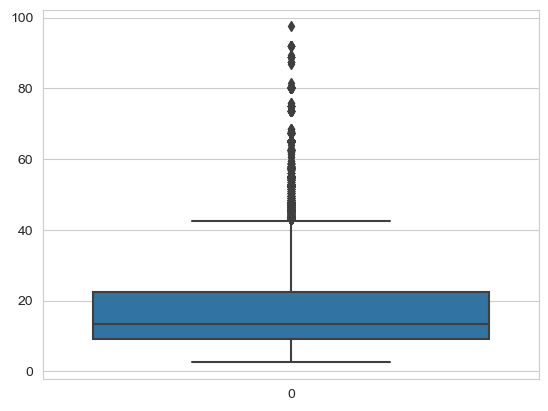

In [63]:
# Checking for outliers in the 'price' column with a boxplot visualization
sns.boxplot(df['price'])

Dapat dilihat pada gambar di atas terdapat banyak outlier, maka dari itu kita akan menghapus outlier dengan menggunakan metode IQR (Interquartile Range)

In [64]:
# Print the old shape of the dataset before handling outliers
print("Old Shape: ", df.shape)

# IQR
# Calculate the upper and lower bounds
Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

# Create arrays with boolean values indicating rows that are outliers
upper_array = np.where(df['price'] >= upper)[0]
lower_array = np.where(df['price'] <= lower)[0]

# Remove outliers
df.drop(index=upper_array, inplace=True)
df.drop(index=lower_array, inplace=True)

# Print the new shape of the dataset after handling outliers
print("New Shape: ", df.shape)

Old Shape:  (637976, 40)
New Shape:  (632387, 40)


<Axes: >

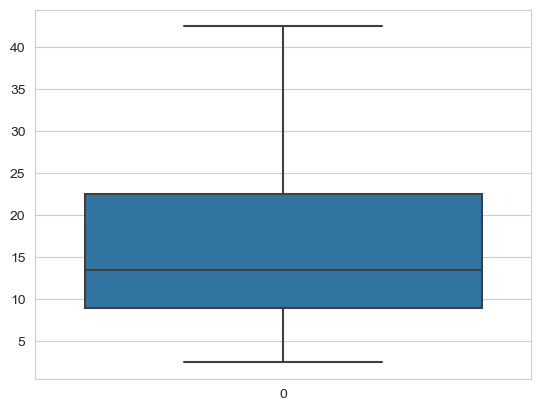

In [65]:
# Checking for outliers in the 'price' column with a boxplot visualization
sns.boxplot(df['price'])

<Axes: >

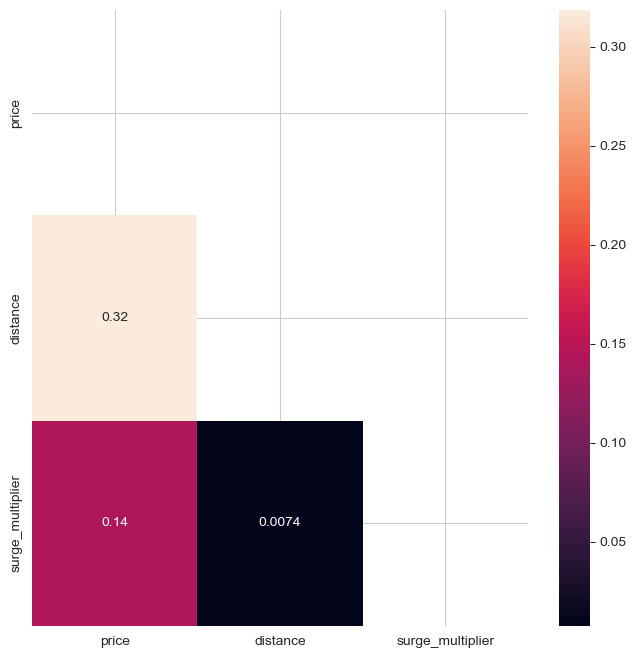

In [66]:
columns = ['price','distance','surge_multiplier']
new_df = df[columns]
plt.figure(figsize=(8,8))
sns.heatmap(new_df.corr(), annot=True, mask=np.triu(new_df.corr()))

Dapat diketahui dari visualisasi di atas bahwa `surge multiplier memiliki nilai skewness yang tinggi dan korelasi yang kurang dengan target (price)`, sedangkan `kolom distance memiliki korelasi yang sangat baik`. Sehingga kita akan menghapus skewness dari surge multiplier menggunakan transformasi BoxCox.

Transformasi Box-Cox merupakan salah satu metode transformasi statistik yang digunakan untuk mengubah data menjadi distribusi yang lebih mendekati distribusi normal, melinearkan model regresi, dan menghomogenkan varians.

In [67]:
# Perform a Box-Cox transformation on the 'surge_multiplier' column and replacing its values
df['surge_multiplier'] = stats.boxcox(df['surge_multiplier'])[0]

# Calculate the skewness of the 'surge_multiplier' column after the transformation
pd.Series(df['surge_multiplier']).skew()

5.64331840785854

Dengan menghitung skewness setelah transformasi Box-Cox, Anda dapat memeriksa sejauh mana transformasi tersebut berhasil mengurangi asimetri dalam data. Jika nilai skewness mendekati nol, itu menunjukkan bahwa transformasi telah berhasil mengubah data menjadi lebih simetris.

In [68]:
df.columns

Index(['cab_type', 'price', 'distance', 'surge_multiplier', 'source_Back Bay',
       'source_Beacon Hill', 'source_Boston University', 'source_Fenway',
       'source_Financial District', 'source_Haymarket Square',
       'source_North End', 'source_North Station',
       'source_Northeastern University', 'source_South Station',
       'source_Theatre District', 'source_West End', 'destination_Back Bay',
       'destination_Beacon Hill', 'destination_Boston University',
       'destination_Fenway', 'destination_Financial District',
       'destination_Haymarket Square', 'destination_North End',
       'destination_North Station', 'destination_Northeastern University',
       'destination_South Station', 'destination_Theatre District',
       'destination_West End', 'name_Black', 'name_Black SUV', 'name_Lux',
       'name_Lux Black', 'name_Lux Black XL', 'name_Lyft', 'name_Lyft XL',
       'name_Shared', 'name_UberPool', 'name_UberX', 'name_UberXL',
       'name_WAV'],
      dtype='obj

In [69]:
df.rename(columns={'name_Black':'Uber Black','name_Black SUV':'Uber Black SUV', 'name_Lux':'Lyft Lux',
                    'name_Lux Black':'Lyft Lux Black','name_Lux Black XL':'Lyft Lux Black XL','name_Lyft':'Lyft',
                    'name_Lyft XL':'Lyft XL', 'name_Shared':'Lyft Shared', 'name_UberPool':'Uber Pool',
                    'name_UberX':'Uber X', 'name_UberXL':'Uber XL', 'name_WAV':'Uber WAV'}, inplace=True)
df.columns

Index(['cab_type', 'price', 'distance', 'surge_multiplier', 'source_Back Bay',
       'source_Beacon Hill', 'source_Boston University', 'source_Fenway',
       'source_Financial District', 'source_Haymarket Square',
       'source_North End', 'source_North Station',
       'source_Northeastern University', 'source_South Station',
       'source_Theatre District', 'source_West End', 'destination_Back Bay',
       'destination_Beacon Hill', 'destination_Boston University',
       'destination_Fenway', 'destination_Financial District',
       'destination_Haymarket Square', 'destination_North End',
       'destination_North Station', 'destination_Northeastern University',
       'destination_South Station', 'destination_Theatre District',
       'destination_West End', 'Uber Black', 'Uber Black SUV', 'Lyft Lux',
       'Lyft Lux Black', 'Lyft Lux Black XL', 'Lyft', 'Lyft XL', 'Lyft Shared',
       'Uber Pool', 'Uber X', 'Uber XL', 'Uber WAV'],
      dtype='object')

In [70]:
# Loop through every columns
for kolom in df:
    # Show uniques in columns, sorted
    unique_val = df[kolom].sort_values().unique()
    print(f"Column: {kolom}")
    print(unique_val)
    print("\n")

Column: cab_type
[0 1]


Column: price
[ 2.5   3.    3.5   4.5   5.    5.5   6.    6.5   7.    7.5   7.98  8.
  8.35  8.5   9.    9.35  9.5  10.   10.5  10.6  11.   11.5  11.6  12.
 12.5  13.   13.5  14.   14.5  15.   15.5  16.   16.5  17.   17.5  18.
 18.35 18.5  19.   19.35 19.5  20.   20.5  21.   21.5  22.   22.5  23.
 23.5  24.   24.5  25.   25.5  26.   26.5  27.   27.5  28.   28.35 28.5
 29.   29.5  30.   30.5  31.   31.5  32.   32.5  33.   33.5  34.   34.5
 35.   35.5  36.   36.5  37.   37.5  37.85 38.   38.5  39.   39.5  40.
 40.5  41.   41.5  42.   42.5 ]


Column: distance
[0.02 0.03 0.04 0.12 0.17 0.27 0.29 0.3  0.35 0.38 0.39 0.4  0.41 0.42
 0.43 0.44 0.45 0.46 0.47 0.48 0.49 0.5  0.51 0.52 0.53 0.54 0.55 0.56
 0.57 0.58 0.59 0.6  0.61 0.62 0.63 0.64 0.65 0.66 0.67 0.68 0.69 0.7
 0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79 0.8  0.81 0.82 0.83 0.84
 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92 0.93 0.94 0.95 0.96 0.97 0.98
 0.99 1.   1.01 1.02 1.03 1.04 1.05 1.06 1.07 1.08 1.09 1

In [71]:
# Delete the 'cab_type' column
df.drop(columns=['cab_type'], inplace=True)
df.head()

,price,distance,surge_multiplier,source_Back Bay,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,...,Lyft Lux,Lyft Lux Black,Lyft Lux Black XL,Lyft,Lyft XL,Lyft Shared,Uber Pool,Uber X,Uber XL,Uber WAV
0,5.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,11.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,7.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,26.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [72]:
# Create a variable X containing all columns except the 'price' column
X = df.drop(columns='price')

# Create a variable y containing the 'price' column
y = df['price']

In [73]:
# Create training and testing data with a 30% indication for testing and 70% for training
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

# **Model Definition**
In this phase, we define the model or algorithm that will be used for our predictive analysis. The choice of the model depends on the nature of the problem and the data we have. We'll use linear regression in this case.
<hr>

In [74]:
# Create a linear regression model object using the scikit-learn library.
model = LinearRegression()

## Linear Regression

Linear regression merupakan salah satu algoritma yang digunakan pada data science dan tergolong pada algoritma supervised learning. Algoritma ini menggunakan prinsip regresi. Regresi membuat model prediksi untuk target variabel berdasarkan dari variabel bebasnya. Jenis algoritma ini sering digunakan untuk mencari hubungan antara variabel-variabel yang ada dan prediksinya. Sehingga pada linear regression, ditujukan untuk melakukan prediksi pada variabel terikat (y) berdasarkan variabel bebas yang diberikan (x). Hasil akhirnya berupa hubungan linear antara variabel input (x) dengan variabel output(y).

## Alasan Memilih Linear Regression

Dalam pendefinisian model ini kami menggunakan model Linear Regression untuk memprediksi price. Alasan menggunakan model Linear Regression dikarenakan model ini dapat memberikan hasil yang mudah dipahami dan mudah diinterpretasikan, selanjutnya  kecepatan komputasi yang dimiliki regresi linear relatif cepat dalam memproses dataset yang besar dalam proyek yang kami kerjakan ini serta juga karena memiliki keakuratan yang akurat dan hasil yang memadai.

# Model Training
Model training is a crucial step in machine learning where the model learns from the data. 
<hr>

In [75]:
# Train the machine learning model using the training data
model.fit(X_train, y_train)

# Make predictions of the target variable y based on the features x on the test dataset X_test
y_pred = model.predict(X_test)

In [76]:
print(X_test.shape)
print(y_test.shape)
print(y_pred.shape)

(189717, 38)
(189717,)
(189717,)


# **Model Evaluation**
Model evaluation is a critical step in assessing how well a machine learning model performs on new, unseen data.
<hr>

In [77]:
# Calculate MAE
print(f'MAE of the Linear Regression model is {mean_absolute_error(y_test, y_pred)}')

# Calculate MAPE
print(f'MAPE of the Linear Regression model is {mean_absolute_percentage_error(y_test, y_pred)}')

# Calculate R2
print(f'R2 of the Linear Regression model is {r2_score(y_test, y_pred)}')

# Calculate MSE
print(f'MSE of the Linear Regression model is {mean_squared_error(y_test, y_pred)}')

# Calculate RMSE
print(f'RMSE of the Linear Regression model is {np.sqrt(mean_squared_error(y_test, y_pred))}')

MAE of the Linear Regression model is 1.6714226640453282
MAPE of the Linear Regression model is 0.12863463947628756
R2 of the Linear Regression model is 0.9320078170032199
MSE of the Linear Regression model is 5.245920810785221
RMSE of the Linear Regression model is 2.290397522436929


# **Model Evaluation**
Model evaluation is a critical step in assessing how well a machine learning model performs on new, unseen data.
<hr>

## Percobaan 1

In [78]:
# Create a copy of the existing dataset and store it in a new variable X_to_test
X_to_test = df.copy()

In [79]:
# Count the number of missing values in the dataset X_to_test
X_to_test.isna().sum()

price                                  0
distance                               0
surge_multiplier                       0
source_Back Bay                        0
source_Beacon Hill                     0
source_Boston University               0
source_Fenway                          0
source_Financial District              0
source_Haymarket Square                0
source_North End                       0
source_North Station                   0
source_Northeastern University         0
source_South Station                   0
source_Theatre District                0
source_West End                        0
destination_Back Bay                   0
destination_Beacon Hill                0
destination_Boston University          0
destination_Fenway                     0
destination_Financial District         0
destination_Haymarket Square           0
destination_North End                  0
destination_North Station              0
destination_Northeastern University    0
destination_Sout

In [80]:
# Display the top 10 rows of the dataset X_to_test
X_to_test.head(10)

,price,distance,surge_multiplier,source_Back Bay,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,...,Lyft Lux,Lyft Lux Black,Lyft Lux Black XL,Lyft,Lyft XL,Lyft Shared,Uber Pool,Uber X,Uber XL,Uber WAV
0,5.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,11.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,7.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,26.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
5,16.5,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,10.5,1.08,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
7,16.5,1.08,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,3.0,1.08,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
9,27.5,1.08,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
# Dictionary containing attribute values for inference or prediction
to_inference = {'Lyft XL': [1, 0],
                'Uber XL': [0, 1],
                'distance': [2.94, 2.94],
                'source_Boston University':[1,1],
                'destination_West End':[1,1],
                'surge_multiplier': [0, 0]}

In [82]:
# Create a dataset from the to_inference dictionary
pd.DataFrame(to_inference)

,Lyft XL,Uber XL,distance,source_Boston University,destination_West End,surge_multiplier
0,1,0,2.94,1,1,0
1,0,1,2.94,1,1,0


In [83]:
# Merge the X_to_test dataset with the to_inference dictionary dataset
X_to_test = pd.concat([X_to_test, pd.DataFrame(to_inference)], ignore_index=True)

# Display the X_to_test dataset
X_to_test

,price,distance,surge_multiplier,source_Back Bay,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,...,Lyft Lux,Lyft Lux Black,Lyft Lux Black XL,Lyft,Lyft XL,Lyft Shared,Uber Pool,Uber X,Uber XL,Uber WAV
0,5.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,11.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,7.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,26.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9.0,0.44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
632384,9.5,1.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
632385,27.0,1.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
632386,10.0,1.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
632387,NaN,2.94,0.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,0.0,NaN


In [84]:
# Apply one-hot encoding to categorical variables to convert them to numerical in the X_to_test dataset
X_to_test = pd.get_dummies(X_to_test)

# Select the last two rows from the X_to_test dataset
X_to_test = X_to_test[-2:]

# Display the X_to_test dataset
X_to_test

,price,distance,surge_multiplier,source_Back Bay,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,...,Lyft Lux,Lyft Lux Black,Lyft Lux Black XL,Lyft,Lyft XL,Lyft Shared,Uber Pool,Uber X,Uber XL,Uber WAV
632387,NaN,2.94,0.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,0.0,NaN
632388,NaN,2.94,0.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,1.0,NaN


In [85]:
# Replace missing values with 0 in the X_to_test dataset
X_to_test.fillna(0, inplace=True)

# Drop the 'price' column from the X_to_test dataset
X_to_test = X_to_test.drop(columns='price')

# Display the X_to_test dataset
X_to_test

,distance,surge_multiplier,source_Back Bay,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,source_North Station,...,Lyft Lux,Lyft Lux Black,Lyft Lux Black XL,Lyft,Lyft XL,Lyft Shared,Uber Pool,Uber X,Uber XL,Uber WAV
632387,2.94,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
632388,2.94,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [86]:
# Predict the price using the previously trained model
price = model.predict(X_to_test)

# Display the price prediction for the comparison of Uber XL and Lyft XL prices with a distance of 1 and surge_multiplier of 1
price

array([16.46582031, 17.33105469])

Pada baris code di atas kita mencoba untuk melakukan prediksi dengan, ketentuan sebagai berikut :
1. Name Cab = **Lyft XL**
2. Distance = **2.94**
3. Asalnya dari Boston University: 1
4. Memiliki tujuan ke West End: 1
3. Tidak ada kelipatan pengguna (surge_multiplier)

Dapat diketahui price atau tarif yang dihasilkan yaitu sebesar `16.47`

Pada baris code di atas kita mencoba untuk melakukan prediksi dengan, ketentuan sebagai berikut :
1. Name Cab = **Uber XL**
3. Asalnya dari Boston University: 1
4. Memiliki tujuan ke West End: 1
3. Tidak ada kelipatan pengguna (surge_multiplier)

Dapat diketahui price atau tarif yang dihasilkan yaitu sebesar `17.33`

## Percobaan 2

In [87]:
def X_predict_price(name_cab, distance, source_Boston_University, destination_West_End, surge_multiplier):
    loc_index = np.where(X.columns == name_cab)[0]
    
    x = np.zeros(len(X.columns))
    x[0] = distance
    x[1] = source_Boston_University
    x[2] = destination_West_End
    x[3] = surge_multiplier
    
    if len(loc_index) > 0:
        x[loc_index[0]] = 1

    return model.predict([x])[0]

In [88]:
X_predict_price('Lyft XL', 2.94, 0.0, 1, 1)

16.46582031


In [89]:
X_predict_price('Uber XL', 2.94, 0.0, 1, 1)

17.33105469


# **Conclusion**
<hr>

1. Dataset yang digunakan dalam proyek ini adalah "Uber and Lyft Dataset Boston, MA" yang terdiri dari 693071 baris dan 57 kolom. Didalamnya berisi informasi perjalanan rideshare yang dilakukan di Boston, Massachusetts, Amerika Serikat. Dari begitu banyaknya fitur perlu diketahui fitur mana saja yang memiliki korelasi yang cukup, hal itu sangat berguna ketika dalam proses prediksi, dikarenakan `tujuan utama dalam projek ini adalah untuk memprediksi harga maka fitur price` merupakan variabel dependent yang akan menjadi predictand. Maka dari itu dilakukan analisis dengan menggunakan fungsi korelasi dan heatmap plot dari 57 fitur kami mengambil fitur **distance, source, destination, surge_multiplier, dan name_cab** karena fitur-fitur tersebut memiliki korelasi yang cukup berpengaruh ke variabel dependent (**price**).

2. Pada section EDA bisa dilihat, bahwa :
    * Berdasarkan grafik lingkaran, diketahui bahwa persentase pemesanan jenis kendaraan Uber (51,8%) lebih besar daripada Lyft (48,2%).
    * Berdasarkan histogram, diketahui bahwa tingkat distribusi harga mencapai frekuensi tertinggi (100.000) pada rentang price 5-10 dolar.
    * Top 5 source-destination pada cab jenis uber dan lyft memeliki kemiripan, yaitu : Financial District-South Station (dan sebaliknya), Back Bay-North End (dan sebaliknya), West End-Fenway.

3. Hasil analisis Linier Regression :
   * Rata-rata kesalahan mutlak (MAE) dari model Linear Regression adalah 1.6714226640453282 atau 1,67.
   * Rata-rata persentase kesalahan mutlak (MAPE) dari model Linear Regression adalah 0.12863463947628756 atau 0,13.
   * `Nilai R-squared (R2) dari model Linear Regression adalah 0.9320078170032199 atau dibulatkan menjadi 0,93.`
   * Rata-rata kuadrat kesalahan (MSE) dari model Linear Regression adalah 5.245920810785221 atau 5,25.
   * Penyimpangan rata-rata kuadrat (RMSE) dari model Linear Regression adalah 2.290397522436929 atau dibulatkan menjadi 2,3.

    R2 score merupakan salah satu metode yang digunakan untuk mengukur performa evaluasi pada regression. Hasil prediksi diatas dapat dilihat bahwa model prediksi menghasilkan nilai sebesar `0.93 atau 93% yang mana hasil tersebut menunjukkan nilai prediksi yang baik`.

4. `Model telah berhasil digunakan untuk memprediksi dengan 2 algortima percobaan berbeda`. Pada percobaan algortima 1 dan 2 telah berhasil memprediksi price dengan tipe `Lyft XL` dan `Uber XL` dengan distance 2.94, asal Boston University, tujuan West End, dan surge multiplier 0 menghasilkan price sebesar `16.47` dan `17.33`.